# Road Accident and Safety Data

Import library

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as plt
import matplotlib.pyplot as plt
import datetime as dt
from datetime import datetime
import plotly.graph_objs as go
from sklearn.cluster import KMeans
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest, chi2, f_regression, f_classif
import sklearn 
from sklearn.preprocessing import OneHotEncoder
from mlxtend.frequent_patterns import association_rules, apriori
from matplotlib.pyplot import *
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, roc_auc_score,accuracy_score,confusion_matrix, precision_recall_curve, auc, roc_curve, recall_score, classification_report 
from termcolor import colored
from sklearn.calibration import calibration_curve
import warnings
warnings.filterwarnings("ignore")
import plotly.io as pio
pio.renderers.default='notebook'

Read 3 data sets such as vehicles, casualties and accidents

In [2]:
df_Vehicles=pd.read_csv('Road Safety Data- Vehicles 2019.csv',dtype={'df_Vehicles': int})
df_Casualties=pd.read_csv('Road Safety Data - Casualties 2019.csv',dtype={'df_Casualties': int})
df_Accidents=pd.read_csv('Road Safety Data - Accidents 2019.csv', parse_dates=['Date'],dtype={'df_Accidents': int})

Check columns, entries, null value and type

In [3]:
df_Accidents.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117536 entries, 0 to 117535
Data columns (total 32 columns):
 #   Column                                       Non-Null Count   Dtype         
---  ------                                       --------------   -----         
 0   Accident_Index                               117536 non-null  object        
 1   Location_Easting_OSGR                        117508 non-null  float64       
 2   Location_Northing_OSGR                       117508 non-null  float64       
 3   Longitude                                    117508 non-null  float64       
 4   Latitude                                     117508 non-null  float64       
 5   Police_Force                                 117536 non-null  int64         
 6   Accident_Severity                            117536 non-null  int64         
 7   Number_of_Vehicles                           117536 non-null  int64         
 8   Number_of_Casualties                         117536 non-null  in

In [4]:
df_Vehicles.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 216381 entries, 0 to 216380
Data columns (total 23 columns):
 #   Column                            Non-Null Count   Dtype 
---  ------                            --------------   ----- 
 0   Accident_Index                    216381 non-null  object
 1   Vehicle_Reference                 216381 non-null  int64 
 2   Vehicle_Type                      216381 non-null  int64 
 3   Towing_and_Articulation           216381 non-null  int64 
 4   Vehicle_Manoeuvre                 216381 non-null  int64 
 5   Vehicle_Location-Restricted_Lane  216381 non-null  int64 
 6   Junction_Location                 216381 non-null  int64 
 7   Skidding_and_Overturning          216381 non-null  int64 
 8   Hit_Object_in_Carriageway         216381 non-null  int64 
 9   Vehicle_Leaving_Carriageway       216381 non-null  int64 
 10  Hit_Object_off_Carriageway        216381 non-null  int64 
 11  1st_Point_of_Impact               216381 non-null  int64 
 12  Wa

In [5]:
df_Casualties.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 153158 entries, 0 to 153157
Data columns (total 16 columns):
 #   Column                              Non-Null Count   Dtype 
---  ------                              --------------   ----- 
 0   Accident_Index                      153158 non-null  object
 1   Vehicle_Reference                   153158 non-null  int64 
 2   Casualty_Reference                  153158 non-null  int64 
 3   Casualty_Class                      153158 non-null  int64 
 4   Sex_of_Casualty                     153158 non-null  int64 
 5   Age_of_Casualty                     153158 non-null  int64 
 6   Age_Band_of_Casualty                153158 non-null  int64 
 7   Casualty_Severity                   153158 non-null  int64 
 8   Pedestrian_Location                 153158 non-null  int64 
 9   Pedestrian_Movement                 153158 non-null  int64 
 10  Car_Passenger                       153158 non-null  int64 
 11  Bus_or_Coach_Passenger              153

# Clean data

Plot missing values of data accidents, casualties and vehicles

,Features,MissingPercent
5,LSOA_of_Accident_Location,4.861489
4,Time,0.053601
0,Location_Easting_OSGR,0.023822
1,Location_Northing_OSGR,0.023822
2,Longitude,0.023822
3,Latitude,0.023822


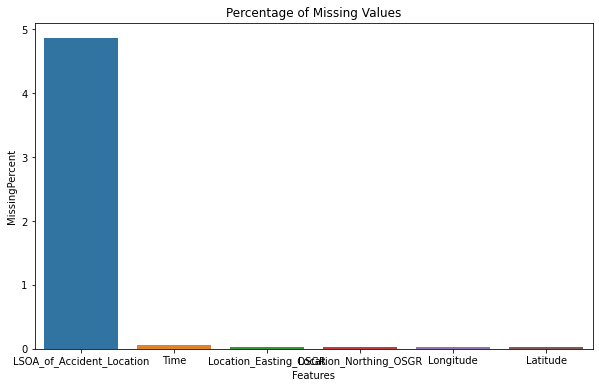

In [6]:
# Function showing missing values in each column
def get_missings(df):
    labels,values = list(),list()
    if df.isna().sum().sum()>0:
        for column in df.columns:
            if df[column].isnull().sum():
                labels.append(column)
                values.append((df[column].isnull().sum() / len(df[column]))*100)

                #Make a dataframe 
        missings=pd.DataFrame({'Features':labels,'MissingPercent':values }).sort_values(by='MissingPercent',ascending=False)
        plt.figure(figsize=(10,6))
        sns.barplot(x=missings.Features,y=missings.MissingPercent).set_title('Percentage of Missing Values')
        return missings
    else:
        return False

get_missings(df_Accidents)

There are no casualties missing values

In [7]:
# Function showing missing values in each column
def get_missings(df):
    labels,values = list(),list()
    if df.isna().sum().sum()>0:
        for column in df.columns:
            if df[column].isnull().sum():
                labels.append(column)
                values.append((df[column].isnull().sum() / len(df[column]))*100)

                #Make a dataframe 
        missings=pd.DataFrame({'Features':labels,'MissingPercent':values }).sort_values(by='MissingPercent',ascending=False)
        plt.figure(figsize=(10,6))
        sns.barplot(x=missings.Features,y=missings.MissingPercent).set_title('Percentage of Missing Values')
        return missings
    else:
        return False

get_missings(df_Casualties)

False

There are no vehicles missing values

In [8]:
# Function showing missing values in each column
def get_missings(df):
    labels,values = list(),list()
    if df.isna().sum().sum()>0:
        for column in df.columns:
            if df[column].isnull().sum():
                labels.append(column)
                values.append((df[column].isnull().sum() / len(df[column]))*100)

                #Make a dataframe 
        missings=pd.DataFrame({'Features':labels,'MissingPercent':values }).sort_values(by='MissingPercent',ascending=False)
        plt.figure(figsize=(10,6))
        sns.barplot(x=missings.Features,y=missings.MissingPercent).set_title('Percentage of Missing Values')
        return missings
    else:
        return False

get_missings(df_Vehicles)

False

Drop most of missing values in accidents

In [9]:
## drop most of missing values in accidents
df_Accidents.drop(['Location_Easting_OSGR', 'Location_Northing_OSGR','LSOA_of_Accident_Location'], axis=1, inplace=True)
## drop null in accidents
df_Accidents.dropna(inplace=True)

Check information of data again, now there are no missing values

In [10]:
df_Vehicles.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 216381 entries, 0 to 216380
Data columns (total 23 columns):
 #   Column                            Non-Null Count   Dtype 
---  ------                            --------------   ----- 
 0   Accident_Index                    216381 non-null  object
 1   Vehicle_Reference                 216381 non-null  int64 
 2   Vehicle_Type                      216381 non-null  int64 
 3   Towing_and_Articulation           216381 non-null  int64 
 4   Vehicle_Manoeuvre                 216381 non-null  int64 
 5   Vehicle_Location-Restricted_Lane  216381 non-null  int64 
 6   Junction_Location                 216381 non-null  int64 
 7   Skidding_and_Overturning          216381 non-null  int64 
 8   Hit_Object_in_Carriageway         216381 non-null  int64 
 9   Vehicle_Leaving_Carriageway       216381 non-null  int64 
 10  Hit_Object_off_Carriageway        216381 non-null  int64 
 11  1st_Point_of_Impact               216381 non-null  int64 
 12  Wa

In [11]:
df_Casualties.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 153158 entries, 0 to 153157
Data columns (total 16 columns):
 #   Column                              Non-Null Count   Dtype 
---  ------                              --------------   ----- 
 0   Accident_Index                      153158 non-null  object
 1   Vehicle_Reference                   153158 non-null  int64 
 2   Casualty_Reference                  153158 non-null  int64 
 3   Casualty_Class                      153158 non-null  int64 
 4   Sex_of_Casualty                     153158 non-null  int64 
 5   Age_of_Casualty                     153158 non-null  int64 
 6   Age_Band_of_Casualty                153158 non-null  int64 
 7   Casualty_Severity                   153158 non-null  int64 
 8   Pedestrian_Location                 153158 non-null  int64 
 9   Pedestrian_Movement                 153158 non-null  int64 
 10  Car_Passenger                       153158 non-null  int64 
 11  Bus_or_Coach_Passenger              153

In [12]:
df_Accidents.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 117445 entries, 0 to 117535
Data columns (total 29 columns):
 #   Column                                       Non-Null Count   Dtype         
---  ------                                       --------------   -----         
 0   Accident_Index                               117445 non-null  object        
 1   Longitude                                    117445 non-null  float64       
 2   Latitude                                     117445 non-null  float64       
 3   Police_Force                                 117445 non-null  int64         
 4   Accident_Severity                            117445 non-null  int64         
 5   Number_of_Vehicles                           117445 non-null  int64         
 6   Number_of_Casualties                         117445 non-null  int64         
 7   Date                                         117445 non-null  datetime64[ns]
 8   Day_of_Week                                  117445 non-null  in

# Add new columns

Add new columns: day, month and year by Date

In [13]:
df_Accidents['Day'] = pd.DatetimeIndex(df_Accidents['Date']).day
df_Accidents['Month'] = pd.DatetimeIndex(df_Accidents['Date']).month
df_Accidents['Year'] = pd.DatetimeIndex(df_Accidents['Date']).year

Add new column: Hour by Time

In [14]:
# slice first and second string
df_Accidents['Hour'] = df_Accidents['Time'].str[0:2]

# convert to numeric datetype
df_Accidents['Hour'] = pd.to_numeric(df_Accidents['Hour'])

# drop null values
df_Accidents = df_Accidents.dropna(subset=['Hour'])

# cast to integer values
df_Accidents['Hour'] = df_Accidents['Hour'].astype('int')

Add new columns decimal time by using time columns

In [15]:
df_Accidents['Converted_time'] = pd.DatetimeIndex(df_Accidents['Time'])
df_Accidents['decimal_time'] = df_Accidents['Converted_time'].dt.hour + df_Accidents['Converted_time'].dt.minute/60

Make a function to add the name because data is integers change it to string and clean some data which is the missing value such as -1 or other by changing -1 to np. nan. After that, we can dropna.

In [16]:
#### add vehicle name
# We can group Motorcycle 50cc and under (No.2) and Motorcycle 125cc and under (No.3) to Motorcycle 125cc and under

def vehicle(vehicle):
    if vehicle == 1:
        return 'Pedal cycle'
    elif vehicle == 2:
        return 'Motorcycle 125cc and under'
    elif vehicle == 3:
        return 'Motorcycle 125cc and under'
    elif vehicle == 4:
        return 'Motorcycle over 125cc and up to 500cc'
    elif vehicle == 5:
        return 'Motorcycle over 500cc'
    elif vehicle == 8:
        return 'Taxi/Private hire car'
    elif vehicle == 9:
        return 'Car'
    elif vehicle == 10:
        return 'Minibus (8 - 16 passenger seats)'
    elif vehicle == 11:
        return 'Bus or coach (17 or more pass seats)'
    elif vehicle == 16:
        return 'Ridden horse'
    elif vehicle == 17:
        return 'Agricultural vehicle'
    elif vehicle == 18:
        return 'Tram'
    elif vehicle == 19:
        return 'Van / Goods 3.5 tonnes mgw or under'
    elif vehicle == 20:
        return 'Goods over 3.5t. and under 7.5t'
    elif vehicle == 21:
        return 'Goods 7.5 tonnes mgw and over'
    elif vehicle == 22:
        return 'Mobility scooter'
    elif vehicle == 23:
        return 'Electric motorcycle'
    elif vehicle == 90:
        return 'Other vehicle'
    elif vehicle == 97:
        return 'Motorcycle - unknown cc'
    elif vehicle == 98:
        return 'Goods vehicle - unknown weight'
    else:
        return np.nan
    
#### add day of week name

def week(week):
    if week == 1:
        return 'Sunday'
    elif week == 2:
        return 'Monday'
    elif week == 3:
        return 'Tuesday'
    elif week == 4:
        return 'Wednesday'
    elif week == 5:
        return 'Thursday'
    elif week == 6:
        return 'Friday'
    elif week == 7:
        return 'Saturday'
    else:
        return np.nan

#### add pedestrian name    
    
def pedestrian(pedestrian):
    if  pedestrian == 0:
        return 'No physical crossing facilities within 50 metres'
    elif pedestrian == 1:
        return 'Zebra'
    elif pedestrian == 4:
        return 'Pelican, puffin, toucan or similar'
    elif pedestrian == 5:
        return 'Pedestrian phase at traffic signal junction'
    elif pedestrian == 7:
        return 'Footbridge or subway'
    elif pedestrian == 8:
        return 'Central refuge'
    else:
        return np.nan
    
    
#### add accident severity name  
    
def accident_severity(accident_severity):
    if accident_severity == 1:
        return 'Fatal'
    elif accident_severity == 2:
        return 'Serious'
    elif accident_severity == 3:
        return 'Slight'
    else:
        return np.nan

    
#### add sex of driver name  

    
def Sex_of_Driver(Sex_of_Driver):
    if  Sex_of_Driver == 1:
        return 'Male'
    elif Sex_of_Driver == 2:
        return 'Female'
    else:
        return np.nan
    
#### add sex of casualty name  
    
def Sex_of_Casualty(Sex_of_Casualty):
    if  Sex_of_Casualty == 1:
        return 'Male'
    elif Sex_of_Casualty == 2:
        return 'Female'
    else:
        return np.nan

### add light condition name    
    
def Light_Condition_Situations(Light_Condition_Situations):    
    if Light_Condition_Situations == 1:
        return 'Daylight'
    elif Light_Condition_Situations == 4:
        return 'Darkness - lights lit'
    elif Light_Condition_Situations == 5:
        return 'Darkness - lights unlit'
    elif Light_Condition_Situations == 6:
        return 'Darkness - no lighting'
    elif Light_Condition_Situations == 7:
        return 'Darkness - lighting unknown'
    else:
        return np.nan
    
### add weather condition name
    
def Weather_Condition_Situations(Weather_Condition_Situations): 
    if Weather_Condition_Situations == 1:
        return 'Fine no high winds'
    elif Weather_Condition_Situations == 2:
        return 'Raining no high winds'
    elif Weather_Condition_Situations == 3:
        return 'Snowing no high winds'
    elif Weather_Condition_Situations == 4:
        return 'Fine + high winds'
    elif Weather_Condition_Situations == 5:
        return 'Raining + high winds'
    elif Weather_Condition_Situations == 6:
        return 'Snowing + high winds'
    elif Weather_Condition_Situations == 7:
        return 'Fog or mist'
    else:
        return 'Other'
    
### add road surface condition name

def Road_Surface_Condition_Situations(Road_Surface_Condition_Situations):
    if Road_Surface_Condition_Situations == 1:
        return 'Dry'
    elif Road_Surface_Condition_Situations == 2:
        return 'Wet or damp'
    elif Road_Surface_Condition_Situations == 3:
        return 'Snow'
    elif Road_Surface_Condition_Situations == 4:
        return 'Frost or ice'
    elif Road_Surface_Condition_Situations == 5:
        return 'Flood over 3cm. deep'
    elif Road_Surface_Condition_Situations == 6:
        return 'Oil or diesel'
    elif Road_Surface_Condition_Situations == 7:
        return 'Mud'
    else:
        return np.nan
    
### special conditions at site name
    
def Special_Conditions_at_Site_Situations(Special_Conditions_at_Site_Situations): 
    if Special_Conditions_at_Site_Situations == 1:
        return 'Auto traffic signal - out'
    elif Special_Conditions_at_Site_Situations == 2:
        return 'Auto signal part defective'
    elif Special_Conditions_at_Site_Situations == 3:
        return 'Road sign or marking defective or obscured'
    elif Special_Conditions_at_Site_Situations == 4:
        return 'Roadworks'
    elif Special_Conditions_at_Site_Situations == 5:
        return 'Road surface defective'
    elif Special_Conditions_at_Site_Situations == 6:
        return 'Oil or diesel'
    elif Special_Conditions_at_Site_Situations == 7:
        return 'Mud'
    else:
        return np.nan
    
### carriageway hazard name
    
def Carriageway_Hazards_Situations(Carriageway_Hazards_Situations): 
    if Carriageway_Hazards_Situations == 1:
        return 'Vehicle load on road'
    elif Carriageway_Hazards_Situations == 2:
        return 'Other object on road'
    elif Carriageway_Hazards_Situations == 3:
        return 'Previous accident'
    elif Carriageway_Hazards_Situations == 4:
        return 'Dog on road'
    elif Carriageway_Hazards_Situations == 5:
        return 'Other animal on road'
    elif Carriageway_Hazards_Situations == 6:
        return 'Pedestrian in carriageway - not injured'
    elif Carriageway_Hazards_Situations == 7:
        return 'Any animal in carriageway (except ridden horse)'
    else:
        return np.nan
    
### urban and rural area name    
    
def Urban_Rural(Urban_Rural):
    if Urban_Rural == 1:
        return 'Urban'
    elif Urban_Rural == 2:
        return 'Rural'
    else:
        return np.nan


### add all to dataframe

df_Casualties['Sex of Casualty'] = df_Casualties['Sex_of_Casualty'].apply(Sex_of_Casualty)      
df_Vehicles['Sex of Driver'] = df_Vehicles['Sex_of_Driver'].apply(Sex_of_Driver)      
df_Vehicles['Name_of_vehicle'] = df_Vehicles['Vehicle_Type'].apply(vehicle)
df_Accidents['Name of day of week'] = df_Accidents['Day_of_Week'].apply(week)  
df_Accidents['Pedestrian']= df_Accidents['Pedestrian_Crossing-Physical_Facilities'].apply(pedestrian)
df_Accidents['Name of Accident Severity'] = df_Accidents['Accident_Severity'].apply(accident_severity)
df_Accidents['Light_Condition_Situations'] = df_Accidents['Light_Conditions'].apply(Light_Condition_Situations)  
df_Accidents['Weather_Condition_Situations'] = df_Accidents['Weather_Conditions'].apply(Weather_Condition_Situations)  
df_Accidents['Road_Surface_Condition_Situations'] = df_Accidents['Road_Surface_Conditions'].apply(Road_Surface_Condition_Situations)  
df_Accidents['Urban_Rural'] = df_Accidents['Urban_or_Rural_Area'].apply(Urban_Rural)  





Remove -1 (NULL or out of range values) in numeric features

In [17]:
df_Accidents['Speed_limit'] = df_Accidents['Speed_limit'].replace(-1,np.nan)

Now -1 in specific columns is nan dropna to remove all by dropna

In [18]:
df_Accidents.dropna(inplace=True)
df_Vehicles.dropna(inplace=True)
df_Casualties.dropna(inplace=True)

# Data merging

Merge accidents and vehicles connect by accident index and use inner join

In [19]:
dfVehicle_Accident=pd.merge(df_Accidents,df_Vehicles,how='inner',on='Accident_Index')
dfVehicle_Accident

,Accident_Index,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,...,Age_of_Driver,Age_Band_of_Driver,Engine_Capacity_(CC),Propulsion_Code,Age_of_Vehicle,Driver_IMD_Decile,Driver_Home_Area_Type,Vehicle_IMD_Decile,Sex of Driver,Name_of_vehicle
0,2019010128300,-0.153842,51.508057,1,3,2,3,2019-02-18,2,17:50,...,58,9,-1,-1,-1,2,1,2,Male,Car
1,2019010155191,-0.124193,51.526795,1,3,2,1,2019-01-01,3,01:50,...,45,7,-1,-1,-1,4,1,4,Male,Car
2,2019010155191,-0.124193,51.526795,1,3,2,1,2019-01-01,3,01:50,...,33,6,-1,-1,-1,-1,-1,-1,Male,Pedal cycle
3,2019010155192,-0.191044,51.546387,1,2,1,1,2019-01-01,3,01:20,...,32,6,-1,-1,-1,3,1,3,Male,Car
4,2019010155194,-0.200064,51.541121,1,3,2,2,2019-01-01,3,00:40,...,47,8,-1,-1,-1,3,1,3,Female,Car
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151490,2019984107019,-2.983499,55.215407,98,3,4,1,2019-05-30,5,08:46,...,20,4,2198,2,4,5,3,5,Male,Van / Goods 3.5 tonnes mgw or under
151491,2019984107219,-3.274645,54.991685,98,3,2,1,2019-06-21,6,15:30,...,33,6,1997,2,12,3,2,3,Male,Car
151492,2019984107219,-3.274645,54.991685,98,3,2,1,2019-06-21,6,15:30,...,61,9,2967,2,5,7,3,7,Male,Car
151493,2019984107419,-2.997491,55.148292,98,3,1,1,2019-06-29,7,14:10,...,78,11,1597,2,6,8,3,8,Male,Car


Merge accidents and casualty connect by accident index and use inner join

In [20]:
dfCasualty_Accident=pd.merge(df_Accidents,df_Casualties,how='inner',on='Accident_Index')
dfCasualty_Accident

,Accident_Index,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,...,Casualty_Severity,Pedestrian_Location,Pedestrian_Movement,Car_Passenger,Bus_or_Coach_Passenger,Pedestrian_Road_Maintenance_Worker,Casualty_Type,Casualty_Home_Area_Type,Casualty_IMD_Decile,Sex of Casualty
0,2019010128300,-0.153842,51.508057,1,3,2,3,2019-02-18,2,17:50,...,3,0,0,0,0,0,9,1,2,Male
1,2019010128300,-0.153842,51.508057,1,3,2,3,2019-02-18,2,17:50,...,3,0,0,1,0,0,9,1,5,Female
2,2019010128300,-0.153842,51.508057,1,3,2,3,2019-02-18,2,17:50,...,3,0,0,2,0,0,9,1,5,Female
3,2019010155191,-0.124193,51.526795,1,3,2,1,2019-01-01,3,01:50,...,3,0,0,0,0,0,1,1,1,Female
4,2019010155192,-0.191044,51.546387,1,2,1,1,2019-01-01,3,01:20,...,2,5,4,0,0,0,0,1,4,Male
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125243,2019984106919,-3.368899,55.047323,98,3,1,1,2019-05-18,7,01:00,...,3,0,0,0,0,0,19,3,6,Male
125244,2019984107019,-2.983499,55.215407,98,3,4,1,2019-05-30,5,08:46,...,3,0,0,0,0,0,19,1,1,Male
125245,2019984107219,-3.274645,54.991685,98,3,2,1,2019-06-21,6,15:30,...,3,0,0,0,0,0,9,3,7,Male
125246,2019984107419,-2.997491,55.148292,98,3,1,1,2019-06-29,7,14:10,...,3,5,3,0,0,0,0,3,8,Male


# A) Road accidents by hours of day and day of week with accident severity

Make new columns decimal time by using time columns

In [21]:
df_Accidents['Converted_time'] = pd.DatetimeIndex(df_Accidents['Time'])
df_Accidents['decimal_time'] = df_Accidents['Converted_time'].dt.hour + df_Accidents['Converted_time'].dt.minute/60

# Hours of the day

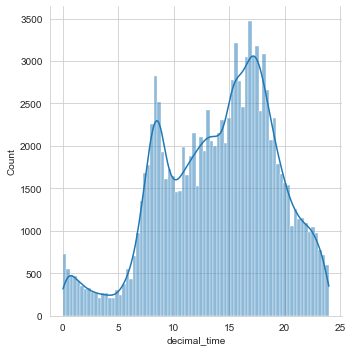

In [22]:
%matplotlib inline
sns.set_style('whitegrid')
sns.displot(data=df_Accidents,x=df_Accidents['decimal_time'],kde=True)
plt.savefig("decimal_time.png", dpi=400,bbox_inches='tight')
plt.show()

# Day of the week

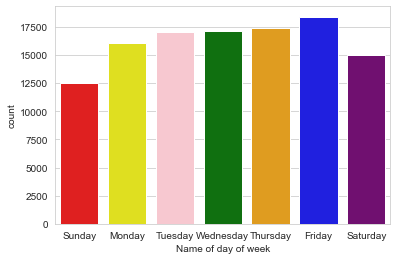

In [23]:
%matplotlib inline
color=['red','Yellow','pink','green','orange','blue','purple']
sns.set_style('whitegrid')
sns.countplot(data=df_Accidents,x=df_Accidents["Name of day of week"], order=['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday'],palette=color)
plt.show()

# Day of the week with accident severity

In [24]:
dayofweek = df_Accidents.groupby(['Name of day of week','Name of Accident Severity']).size().unstack()
dayofweek['sum'] = dayofweek.sum(axis=1)
dayofweek.sort_values('sum',ascending=False)

Name of Accident Severity,Fatal,Serious,Slight,sum
Name of day of week,,,,
Friday,235,3670,14500,18405
Thursday,225,3489,13647,17361
Wednesday,238,3376,13560,17174
Tuesday,237,3294,13482,17013
Monday,224,3139,12738,16101
Saturday,260,3245,11492,14997
Sunday,238,2925,9356,12519


# Day of the week in each day

In [25]:
df_Accidents['Day_of_Week_Color'] = df_Accidents['Day_of_Week'].astype(str)

In [26]:
type('Day_of_Week')

str

In [27]:
Day_of_Week=df_Accidents['Day_of_Week_Color']

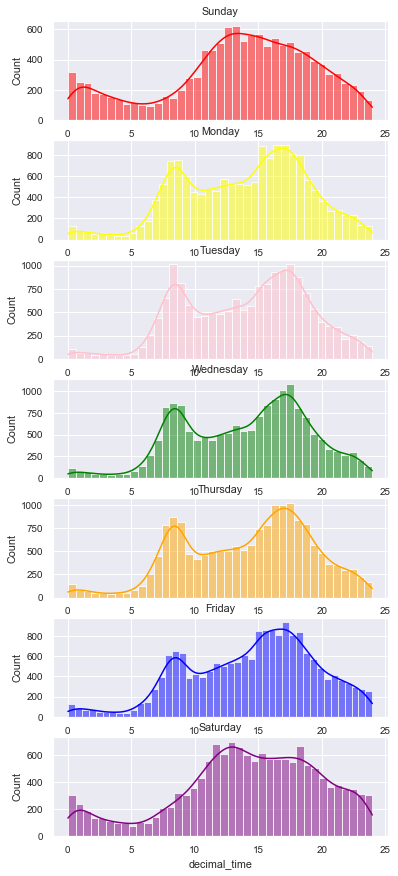

In [28]:
%matplotlib inline
sns.set(font_scale=0.9)
fig, axes =  plt.subplots(7,1,figsize=(6,15))
ax1=sns.histplot(data=df_Accidents[Day_of_Week.str.match('1')],x='decimal_time',color='red',kde=True, ax=axes[0])
ax2=sns.histplot(data=df_Accidents[Day_of_Week.str.match('2')],x='decimal_time',color='yellow',kde=True, ax=axes[1])
ax3=sns.histplot(data=df_Accidents[Day_of_Week.str.match('3')],x='decimal_time',color='pink',kde=True, ax=axes[2])
ax4=sns.histplot(data=df_Accidents[Day_of_Week.str.match('4')],x='decimal_time',color='green',kde=True, ax=axes[3])
ax5=sns.histplot(data=df_Accidents[Day_of_Week.str.match('5')],x='decimal_time',color='orange',kde=True, ax=axes[4])
ax6=sns.histplot(data=df_Accidents[Day_of_Week.str.match('6')],x='decimal_time',color='blue',kde=True, ax=axes[5])
ax7=sns.histplot(data=df_Accidents[Day_of_Week.str.match('7')],x='decimal_time',color='purple',kde=True, ax=axes[6])
ax1.title.set_text('Sunday')
ax2.title.set_text('Monday')
ax3.title.set_text('Tuesday')
ax4.title.set_text('Wednesday')
ax5.title.set_text('Thursday')
ax6.title.set_text('Friday')
ax7.title.set_text('Saturday')

# B) Motorcycle accidents by hours of day and day of week with accident severity

Make new columns decimal time by using time columns(motorcycle)

In [29]:
dfVehicle_Accident['Converted_time'] = pd.DatetimeIndex(dfVehicle_Accident['Time'])

In [30]:
dfVehicle_Accident['decimal_time'] = dfVehicle_Accident['Converted_time'].dt.hour + dfVehicle_Accident['Converted_time'].dt.minute/60

Filter columns that include motorcycles, we have already grouped motorcycles 50cc and under to 125 cc and under since adding new columns

In [31]:
array = ['Motorcycle 125cc and under','Motorcycle over 125cc and up to 500cc','Motorcycle over 500cc','Electric motorcycle']
dfMotorcycle_Accident=dfVehicle_Accident[dfVehicle_Accident['Name_of_vehicle'].isin(array)]

# Hours of the day (motorcycle)

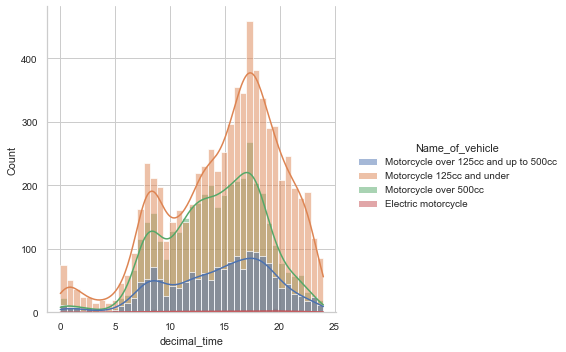

In [32]:
%matplotlib inline
sns.set_style('whitegrid')
sns.displot(data=dfMotorcycle_Accident,x=dfMotorcycle_Accident['decimal_time'],kde=True,hue='Name_of_vehicle')
plt.show()
###hour of the day

# Remove small data that difficult to read from the graph

It's difficult to read electric motorcycle from the graph

In [33]:
array = ['Motorcycle 125cc and under','Motorcycle over 125cc and up to 500cc','Motorcycle over 500cc']
dfMotorcycle_Accident=dfVehicle_Accident[dfVehicle_Accident['Name_of_vehicle'].isin(array)]

# Hours of the day updated (motorcycle)

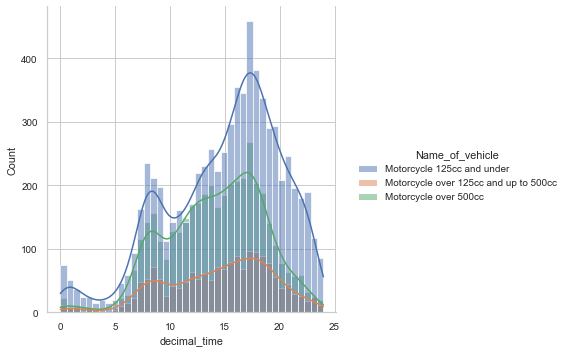

In [34]:
%matplotlib inline
sns.set_style('whitegrid')
sns.displot(data=dfMotorcycle_Accident,x=dfMotorcycle_Accident['decimal_time'],kde=True,hue='Name_of_vehicle',hue_order=['Motorcycle 125cc and under','Motorcycle over 125cc and up to 500cc','Motorcycle over 500cc'])
plt.show()
###hour of the day

# Day of the week table (motorcycle)

In [35]:
dfMotorcycle_Accident_week = dfMotorcycle_Accident.groupby(['Day_of_Week','Name of day of week', 'Name_of_vehicle']).size().unstack()

In [36]:
dfMotorcycle_Accident_week.sort_values(by='Day_of_Week', ascending=True)

,Name_of_vehicle,Motorcycle 125cc and under,Motorcycle over 125cc and up to 500cc,Motorcycle over 500cc
Day_of_Week,Name of day of week,,,
1,Sunday,777,221,674
2,Monday,957,234,508
3,Tuesday,1072,235,548
4,Wednesday,1115,251,579
5,Thursday,1091,270,591
6,Friday,1268,256,600
7,Saturday,892,209,640


# Day of the week conditioned by motorcycle

([<matplotlib.axis.XTick at 0x2133220d610>,
 [Text(0, 0, 'Sunday'),
  Text(1, 0, 'Monday'),
  Text(2, 0, 'Tuesday'),
  Text(3, 0, 'Wednesday'),
  Text(4, 0, 'Thursday'),
  Text(5, 0, 'Friday'),
  Text(6, 0, 'Saturday')])

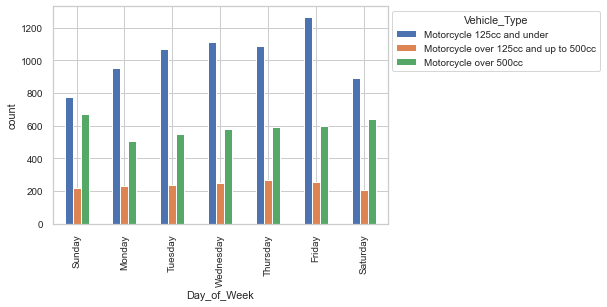

In [37]:
dfMotorcycle_Accident_week=dfMotorcycle_Accident_week.plot(kind = 'bar')
sns.move_legend(dfMotorcycle_Accident_week, "upper left", bbox_to_anchor=(1., 1.), title='Vehicle_Type')
dfMotorcycle_Accident_week.set(xlabel='Day_of_Week', ylabel='count')
plt.xticks(np.arange(7), 
           ['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday'], 
           rotation='vertical')

# Day of the week (motorcycle)

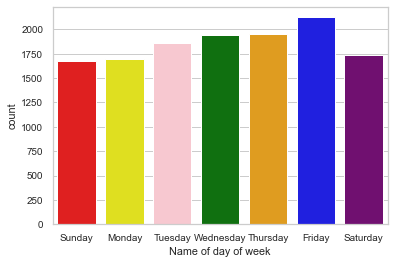

In [38]:
%matplotlib inline
color=['red','Yellow','pink','green','orange','blue','purple']
sns.set_style('whitegrid')
sns.countplot(data=dfMotorcycle_Accident,x=dfMotorcycle_Accident["Name of day of week"], order=['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday'],palette=color)
plt.show()
###day of the week

# Day of the week with accident severity (motorcycle)

In [39]:
motorcycle = dfMotorcycle_Accident.groupby(['Name of day of week','Name of Accident Severity']).size().unstack()
motorcycle['sum'] = motorcycle.sum(axis=1)
motorcycle.sort_values('sum',ascending=False)

Name of Accident Severity,Fatal,Serious,Slight,sum
Name of day of week,,,,
Friday,42,689,1393,2124
Thursday,39,661,1252,1952
Wednesday,42,593,1310,1945
Tuesday,36,533,1286,1855
Saturday,63,639,1039,1741
Monday,34,568,1097,1699
Sunday,71,645,956,1672


# Motorcycle type with accident severity

In [40]:
motorcycle = dfMotorcycle_Accident.groupby(['Name_of_vehicle','Name of Accident Severity']).size().unstack()
motorcycle['sum'] = motorcycle.sum(axis=1)
motorcycle.sort_values('sum',ascending=False)

Name of Accident Severity,Fatal,Serious,Slight,sum
Name_of_vehicle,,,,
Motorcycle 125cc and under,57,1941,5174,7172
Motorcycle over 500cc,236,1842,2062,4140
Motorcycle over 125cc and up to 500cc,34,545,1097,1676


# C) Pedestrians involved in accident by hours of day and day of week with accident severity

Using casualty and accident data set that already merged 

1.'Pedestrian_Location' from casualty

2.'Pedestrian_Movement' from casualty

3.'Pedestrian_Crossing-Physical_Facilities' or new name 'Pedestrian' from accident

# Clean data

Change some number to null and then drop these value

In [41]:
#0 is Not a Pedestrian
dfCasualty_Accident['Pedestrian_Location']=dfCasualty_Accident['Pedestrian_Location'].replace(0, np.nan)

#-1 is Data missing or out of range
dfCasualty_Accident['Pedestrian_Location']=dfCasualty_Accident['Pedestrian_Location'].replace(-1, np.nan)

#9 is Unknown or other
dfCasualty_Accident['Pedestrian_Location']=dfCasualty_Accident['Pedestrian_Location'].replace(9, np.nan)

In [42]:
#0 is Not a Pedestrian
dfCasualty_Accident['Pedestrian_Movement']=dfCasualty_Accident['Pedestrian_Movement'].replace(0, np.nan)

#-1 is Data missing or out of range
dfCasualty_Accident['Pedestrian_Movement']=dfCasualty_Accident['Pedestrian_Movement'].replace(-1, np.nan)

#10 is Unknown or other
dfCasualty_Accident['Pedestrian_Movement']=dfCasualty_Accident['Pedestrian_Movement'].replace(10, np.nan)

Remove null value

In [43]:
dfCasualty_Accident.dropna(inplace=True)

In [44]:
array = ['Central refuge','Footbridge or subway','No physical crossing facilities within 50 metres','Pedestrian phase at traffic signal junction','Pelican, puffin, toucan or similar non-junction pedestrian light crossing','Zebra']
Pedestrian_data=dfCasualty_Accident[dfCasualty_Accident['Pedestrian'].isin(array)]

In [45]:
df_Accidents_predestrian = Pedestrian_data.groupby(['Day_of_Week','Name of day of week', 'Pedestrian']).size().unstack()

In [46]:
df_Accidents_predestrian

,Pedestrian,Central refuge,Footbridge or subway,No physical crossing facilities within 50 metres,Pedestrian phase at traffic signal junction,Zebra
Day_of_Week,Name of day of week,,,,,
1,Sunday,58.0,2.0,914.0,159.0,93.0
2,Monday,102.0,3.0,1478.0,246.0,193.0
3,Tuesday,110.0,NaN,1598.0,298.0,203.0
4,Wednesday,118.0,7.0,1571.0,303.0,188.0
5,Thursday,119.0,7.0,1628.0,279.0,221.0
6,Friday,107.0,3.0,1707.0,310.0,223.0
7,Saturday,85.0,5.0,1276.0,232.0,159.0


Table show food bridge or subway is small data that difficult to read from the graph

# Remove small data that difficult to read from the graph

It's difficult to read footbridge or subway from the graph

In [47]:
array = ['Central refuge','No physical crossing facilities within 50 metres','Pedestrian phase at traffic signal junction','Pelican, puffin, toucan or similar','Zebra']
Pedestrian_data=dfCasualty_Accident[dfCasualty_Accident['Pedestrian'].isin(array)]

# Hours of the day (pedestrians)

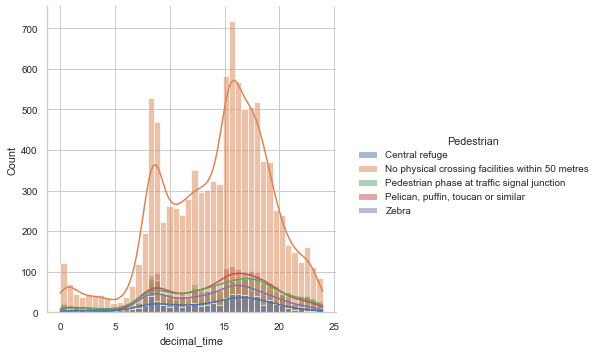

In [48]:
%matplotlib inline
sns.set_style('whitegrid')
sns.displot(data=Pedestrian_data,x=Pedestrian_data['decimal_time'],kde=True,hue='Pedestrian',hue_order=['Central refuge','No physical crossing facilities within 50 metres','Pedestrian phase at traffic signal junction','Pelican, puffin, toucan or similar','Zebra'])
plt.show()
###hour of the day

# Day of the week (pedestrians)

In [49]:
df_Accidents_predestrian = Pedestrian_data.groupby(['Day_of_Week','Name of day of week', 'Pedestrian']).size().unstack()

In [50]:
df_Accidents_predestrian

,Pedestrian,Central refuge,No physical crossing facilities within 50 metres,Pedestrian phase at traffic signal junction,"Pelican, puffin, toucan or similar",Zebra
Day_of_Week,Name of day of week,,,,,
1,Sunday,58,914,159,137,93
2,Monday,102,1478,246,263,193
3,Tuesday,110,1598,298,319,203
4,Wednesday,118,1571,303,292,188
5,Thursday,119,1628,279,302,221
6,Friday,107,1707,310,332,223
7,Saturday,85,1276,232,260,159


[Text(0.5, 0, 'Day_of_Week'), Text(0, 0.5, 'count')]

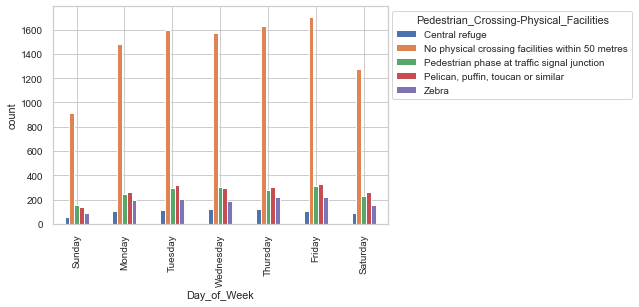

In [51]:
%matplotlib inline
Accidents_predestrian=df_Accidents_predestrian.plot(kind = 'bar')
sns.move_legend(Accidents_predestrian, "upper left", bbox_to_anchor=(1., 1.), title='Pedestrian_Crossing-Physical_Facilities')
plt.xticks(np.arange(7), 
           ['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday'], 
           rotation='vertical')
Accidents_predestrian.set(xlabel='Day_of_Week', ylabel='count')

# Day of week with accident severity (pedestrians)

In [52]:
Pedestrian = Pedestrian_data.groupby(['Name of day of week','Name of Accident Severity']).size().unstack()
Pedestrian['sum'] = Pedestrian.sum(axis=1)
Pedestrian.sort_values('sum',ascending=False)

Name of Accident Severity,Fatal,Serious,Slight,sum
Name of day of week,,,,
Friday,60,765,1854,2679
Thursday,62,733,1754,2549
Tuesday,42,695,1791,2528
Wednesday,50,687,1735,2472
Monday,42,634,1606,2282
Saturday,66,605,1341,2012
Sunday,35,438,888,1361


# Pedestrians involved in accidents with accident severity

In [53]:
pedestrian2 = Pedestrian_data.groupby(['Pedestrian','Name of Accident Severity']).size().unstack()
pedestrian2['sum'] = pedestrian2.sum(axis=1)
pedestrian2.sort_values('sum',ascending=False)

Name of Accident Severity,Fatal,Serious,Slight,sum
Pedestrian,,,,
No physical crossing facilities within 50 metres,241,2873,7058,10172
"Pelican, puffin, toucan or similar",44,604,1257,1905
Pedestrian phase at traffic signal junction,35,557,1235,1827
Zebra,16,290,974,1280
Central refuge,21,233,445,699


# Age pyramid pedestrian involved in accidents

In [54]:
%matplotlib inline
bins=[0,6,11,16,21,26,31,36,41,46,51,56,61,66,71,76,81,86,110]
labels=['0-5','6-10','11-15','16-20','21-25','26-30','31-35','36-40','41-45','46-50','51-55','56-60','61-65','66-70','71-75','76-80','81-85','86+']
dfCasualty_Accident['Age_of_Casualty_range'] = pd.cut(dfCasualty_Accident['Age_of_Casualty'],bins=bins,labels=labels,right=False)
age_sex=dfCasualty_Accident.groupby(['Age_of_Casualty_range','Sex of Casualty']).size().unstack('Sex of Casualty')
age_sex['Age_of_Casualty_range']=age_sex.index.get_level_values(0).tolist()
y_age = age_sex['Age_of_Casualty_range']
Maleplot = age_sex['Male']
Femaleplot = age_sex['Female']*-1
fig=go.Figure()
fig.add_trace(go.Bar(y=y_age,x=Maleplot,name='Male',orientation ='h',marker=dict(color='darkolivegreen')))
fig.add_trace(go.Bar(y=y_age,x=Femaleplot,name='Female',orientation ='h',marker=dict(color='hotpink')))
fig.update_layout(title= 'Age and Sex of Casualty',title_font_size=18,barmode='overlay',bargap=0.1,bargroupgap=0,
                 yaxis=dict(title='Age'),
                 xaxis=dict(title = 'Population',title_font_size=10))
fig.show("notebook")

# D) Impact of daylight saving on road accidents in week start and stop

------No daylight Savings period------


31 March 2019 - Daylight Saving Time Started 

------Daylight Savings period----------

27 October 2019 - Daylight Saving Time Ended


------No daylight Savings period------

In [55]:
#### add Daylight savings and No daylight savings
    
def day_light_saving(df_Accidents):

    #31 March 2019 - Daylight Saving Time Started
    
    if (df_Accidents['Day'] == 31) and (df_Accidents['Month'] == 3):
        return 'Daylight savings '
    elif (df_Accidents['Day'] >= 1) and (4 <= df_Accidents['Month'] < 10 ):
        return 'Daylight savings '
    elif (df_Accidents['Day'] <= 27) and (df_Accidents['Month'] == 10):
        return 'Daylight savings '
    
    #27 October 2019 - Daylight Saving Time Ended
    
    elif (df_Accidents['Day'] > 27) and (df_Accidents['Month'] == 10):
        return 'No daylight savings '
    elif (df_Accidents['Day'] >= 1) and (df_Accidents['Month'] >= 11):
        return 'No daylight savings '
    else:
        return 'No daylight savings '
    
    
#New columns Daylight savings and No daylight savings    
df_Accidents['day_light_saving'] = df_Accidents.apply(day_light_saving, axis = 1)

Add new columns name

1 week before daylight saving starts 24/03/2019 - 30/03/2019

1 week after daylight saving starts 31/03/2019 - 06/04/2019

1 week before daylight saving starts 21/10/2019 - 27/10/2019

1 week after daylight saving starts 28/10/2019 - 3/11/2019

In [56]:
#### add 1 Week_Saving_light before and after

def saving_light(df_Accidents):

    #1 week before daylight saving start 24/03/2019-30/03/2019
    if (24<=df_Accidents['Day'] <= 30) and (df_Accidents['Month'] == 3):
        return '1 week before daylight saving start'
    
    #1 week after daylight saving start 31/03/2019-06/04/2019
    elif (df_Accidents['Day'] >= 31) and (df_Accidents['Month'] == 3):
        return '1 week after daylight saving start'
    elif (1<=df_Accidents['Day'] <= 6) and (df_Accidents['Month'] == 4):
        return '1 week after daylight saving start'
    
    #1 week before daylight saving start 21/10/2019-27/10/2019
    elif (21<=df_Accidents['Day']<= 27) and (df_Accidents['Month'] == 10):
        return '1 week before daylight saving end'
    
    #1 week after daylight saving start 31/10/2019-3/11/2019
    elif (28<=df_Accidents['Day'] <= 31) and (df_Accidents['Month'] == 10):
        return '1 week after daylight saving end'
    elif (1<=df_Accidents['Day'] <= 3) and (df_Accidents['Month'] == 11):
        return '1 week after daylight saving end' 
    
    else:
        return 'None'

#New columns 1 Week_Saving_light before and after      
df_Accidents['Week_Saving_light'] = df_Accidents.apply(saving_light, axis = 1)

daylight savings have on road traffic accidents in the week after it starts and stops (Seasons)

In [57]:
#### add 1 Week_Saving_light before and after

def Seasons(df_Accidents):

    #1 week before daylight saving start 24/03/2019-30/03/2019
    if (24<=df_Accidents['Day'] <= 30) and (df_Accidents['Month'] == 3):
        return 'Spring'
    
    #1 week after daylight saving start 31/03/2019-06/04/2019
    elif (df_Accidents['Day'] >= 31) and (df_Accidents['Month'] == 3):
        return 'Spring'
    elif (1<=df_Accidents['Day'] <= 6) and (df_Accidents['Month'] == 4):
        return 'Spring'
    
    #1 week before daylight saving start 21/10/2019-27/10/2019
    elif (21<=df_Accidents['Day']<= 27) and (df_Accidents['Month'] == 10):
        return 'Autumn'
    
    #1 week after daylight saving start 31/10/2019-3/11/2019
    elif (28<=df_Accidents['Day'] <= 31) and (df_Accidents['Month'] == 10):
        return 'Autumn'
    elif (1<=df_Accidents['Day'] <= 3) and (df_Accidents['Month'] == 11):
        return 'Autumn' 
    
    else:
        return 'None'

#New columns 1 Week_Saving_light before and after      
df_Accidents['Seasons'] = df_Accidents.apply(Seasons, axis = 1)

# Daylight Saving Start

Filter 1 week before daylight saving starts 24/03/2019 - 30/03/2019 by Date column 

In [58]:
before_daylight_saving_start = df_Accidents.loc[(df_Accidents['Date'] >= '03-24-2019')
                     & (df_Accidents['Date'] <= '03-30-2019')]

1 week before daylight saving starts 24/03/2019 - 30/03/2019 Table

In [59]:
before_daylight_saving_start=before_daylight_saving_start.groupby(['Date','Week_Saving_light','day_light_saving','Seasons']).size().reset_index(name='Accident_Case')
before_daylight_saving_start

,Date,Week_Saving_light,day_light_saving,Seasons,Accident_Case
0,2019-03-24,1 week before daylight saving start,No daylight savings,Spring,287
1,2019-03-25,1 week before daylight saving start,No daylight savings,Spring,326
2,2019-03-26,1 week before daylight saving start,No daylight savings,Spring,317
3,2019-03-27,1 week before daylight saving start,No daylight savings,Spring,299
4,2019-03-28,1 week before daylight saving start,No daylight savings,Spring,321
5,2019-03-29,1 week before daylight saving start,No daylight savings,Spring,400
6,2019-03-30,1 week before daylight saving start,No daylight savings,Spring,300


Filter 1 week after daylight saving starts 31/03/2019 - 06/04/2019 by Date column

In [60]:
after_daylight_saving_start = df_Accidents.loc[(df_Accidents['Date'] >= '03-31-2019')
                     & (df_Accidents['Date'] <= '04-06-2019')]

1 week after daylight saving starts 31/03/2019 - 06/04/2019 Table

In [61]:
after_daylight_saving_start=after_daylight_saving_start.groupby(['Date','Week_Saving_light','day_light_saving','Seasons']).size().reset_index(name='Accident_Case')
after_daylight_saving_start

,Date,Week_Saving_light,day_light_saving,Seasons,Accident_Case
0,2019-03-31,1 week after daylight saving start,Daylight savings,Spring,216
1,2019-04-01,1 week after daylight saving start,Daylight savings,Spring,226
2,2019-04-02,1 week after daylight saving start,Daylight savings,Spring,319
3,2019-04-03,1 week after daylight saving start,Daylight savings,Spring,302
4,2019-04-04,1 week after daylight saving start,Daylight savings,Spring,330
5,2019-04-05,1 week after daylight saving start,Daylight savings,Spring,295
6,2019-04-06,1 week after daylight saving start,Daylight savings,Spring,331


# Daylight Saving Stop

Filter 1 week before daylight saving starts 21/10/2019 - 27/10/2019 by Date column

In [62]:
before_daylight_stop = df_Accidents.loc[(df_Accidents['Date'] >= '10-21-2019')
                     & (df_Accidents['Date'] <= '10-27-2019')]

1 week before daylight saving starts 21/10/2019 - 27/10/2019 Table

In [63]:
before_daylight_stop=before_daylight_stop.groupby(['Date','Week_Saving_light','day_light_saving','Seasons']).size().reset_index(name='Accident_Case')
before_daylight_stop

,Date,Week_Saving_light,day_light_saving,Seasons,Accident_Case
0,2019-10-21,1 week before daylight saving end,Daylight savings,Autumn,293
1,2019-10-22,1 week before daylight saving end,Daylight savings,Autumn,291
2,2019-10-23,1 week before daylight saving end,Daylight savings,Autumn,336
3,2019-10-24,1 week before daylight saving end,Daylight savings,Autumn,306
4,2019-10-25,1 week before daylight saving end,Daylight savings,Autumn,358
5,2019-10-26,1 week before daylight saving end,Daylight savings,Autumn,275
6,2019-10-27,1 week before daylight saving end,Daylight savings,Autumn,272


Filter 1 week after daylight saving starts 28/10/2019 - 3/11/2019 by Date column

In [64]:
after_daylight_stop = df_Accidents.loc[(df_Accidents['Date'] >= '10-28-2019')
                     & (df_Accidents['Date'] <= '11-03-2019')]

1 week after daylight saving starts 28/10/2019 - 3/11/2019 Table

In [65]:
after_daylight_stop=after_daylight_stop.groupby(['Date','Week_Saving_light','day_light_saving','Seasons']).size().reset_index(name='Accident_Case')
after_daylight_stop

,Date,Week_Saving_light,day_light_saving,Seasons,Accident_Case
0,2019-10-28,1 week after daylight saving end,No daylight savings,Autumn,307
1,2019-10-29,1 week after daylight saving end,No daylight savings,Autumn,314
2,2019-10-30,1 week after daylight saving end,No daylight savings,Autumn,306
3,2019-10-31,1 week after daylight saving end,No daylight savings,Autumn,338
4,2019-11-01,1 week after daylight saving end,No daylight savings,Autumn,331
5,2019-11-02,1 week after daylight saving end,No daylight savings,Autumn,296
6,2019-11-03,1 week after daylight saving end,No daylight savings,Autumn,313


Append data 4 weeks


1 week before daylight saving starts 24/03/2019 - 30/03/2019

1 week after daylight saving starts 31/03/2019 - 06/04/2019

1 week before daylight saving starts 21/10/2019 - 27/10/2019

1 week after daylight saving starts 28/10/2019 - 3/11/2019

In [66]:
daylight1=before_daylight_saving_start.append(after_daylight_saving_start)

In [67]:
daylight1

,Date,Week_Saving_light,day_light_saving,Seasons,Accident_Case
0,2019-03-24,1 week before daylight saving start,No daylight savings,Spring,287
1,2019-03-25,1 week before daylight saving start,No daylight savings,Spring,326
2,2019-03-26,1 week before daylight saving start,No daylight savings,Spring,317
3,2019-03-27,1 week before daylight saving start,No daylight savings,Spring,299
4,2019-03-28,1 week before daylight saving start,No daylight savings,Spring,321
5,2019-03-29,1 week before daylight saving start,No daylight savings,Spring,400
6,2019-03-30,1 week before daylight saving start,No daylight savings,Spring,300
0,2019-03-31,1 week after daylight saving start,Daylight savings,Spring,216
1,2019-04-01,1 week after daylight saving start,Daylight savings,Spring,226
2,2019-04-02,1 week after daylight saving start,Daylight savings,Spring,319


In [68]:
daylight2=before_daylight_stop.append(after_daylight_stop)

In [69]:
daylight2

,Date,Week_Saving_light,day_light_saving,Seasons,Accident_Case
0,2019-10-21,1 week before daylight saving end,Daylight savings,Autumn,293
1,2019-10-22,1 week before daylight saving end,Daylight savings,Autumn,291
2,2019-10-23,1 week before daylight saving end,Daylight savings,Autumn,336
3,2019-10-24,1 week before daylight saving end,Daylight savings,Autumn,306
4,2019-10-25,1 week before daylight saving end,Daylight savings,Autumn,358
5,2019-10-26,1 week before daylight saving end,Daylight savings,Autumn,275
6,2019-10-27,1 week before daylight saving end,Daylight savings,Autumn,272
0,2019-10-28,1 week after daylight saving end,No daylight savings,Autumn,307
1,2019-10-29,1 week after daylight saving end,No daylight savings,Autumn,314
2,2019-10-30,1 week after daylight saving end,No daylight savings,Autumn,306


In [70]:
daylight=daylight1.append(daylight2)

In [71]:
daylight.reset_index()

,index,Date,Week_Saving_light,day_light_saving,Seasons,Accident_Case
0,0,2019-03-24,1 week before daylight saving start,No daylight savings,Spring,287
1,1,2019-03-25,1 week before daylight saving start,No daylight savings,Spring,326
2,2,2019-03-26,1 week before daylight saving start,No daylight savings,Spring,317
3,3,2019-03-27,1 week before daylight saving start,No daylight savings,Spring,299
4,4,2019-03-28,1 week before daylight saving start,No daylight savings,Spring,321
5,5,2019-03-29,1 week before daylight saving start,No daylight savings,Spring,400
6,6,2019-03-30,1 week before daylight saving start,No daylight savings,Spring,300
7,0,2019-03-31,1 week after daylight saving start,Daylight savings,Spring,216
8,1,2019-04-01,1 week after daylight saving start,Daylight savings,Spring,226
9,2,2019-04-02,1 week after daylight saving start,Daylight savings,Spring,319


In [72]:
df_group_daylight = daylight.groupby(['Week_Saving_light','day_light_saving'])['Accident_Case'].sum().reset_index()
df_group_daylight

,Week_Saving_light,day_light_saving,Accident_Case
0,1 week after daylight saving end,No daylight savings,2205
1,1 week after daylight saving start,Daylight savings,2019
2,1 week before daylight saving end,Daylight savings,2131
3,1 week before daylight saving start,No daylight savings,2250


In [73]:
df_daylight=df_group_daylight.reindex([3,1,2,0])

# Daylight savings have on road traffic accidents in the week after it starts and stops (Table)

1 week before daylight saving starts 24/03/2019 - 30/03/2019

1 week after daylight saving starts 31/03/2019 - 06/04/2019

1 week before daylight saving starts 21/10/2019 - 27/10/2019

1 week after daylight saving starts 28/10/2019 - 3/11/2019

In [74]:
df_daylight

,Week_Saving_light,day_light_saving,Accident_Case
3,1 week before daylight saving start,No daylight savings,2250
1,1 week after daylight saving start,Daylight savings,2019
2,1 week before daylight saving end,Daylight savings,2131
0,1 week after daylight saving end,No daylight savings,2205


# Daylight savings have on road traffic accidents in the week after it starts and stops (Bar chart)

1 week before daylight saving starts 24/03/2019 - 30/03/2019

1 week after daylight saving starts 31/03/2019 - 06/04/2019

1 week before daylight saving starts 21/10/2019 - 27/10/2019

1 week after daylight saving starts 28/10/2019 - 3/11/2019

(array([0, 1, 2, 3]),
 [Text(0, 0, '1 week before daylight saving start'),
  Text(1, 0, '1 week after daylight saving start'),
  Text(2, 0, '1 week before daylight saving end'),
  Text(3, 0, '1 week after daylight saving end')])

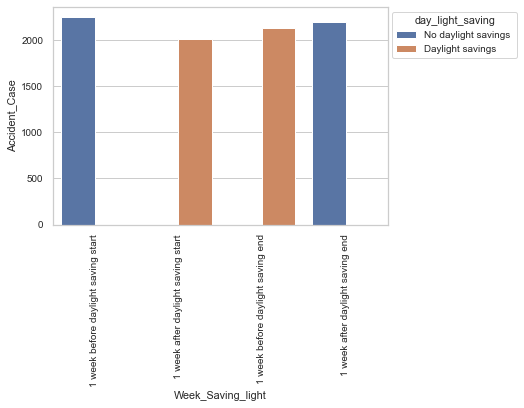

In [75]:
%matplotlib inline
ax=sns.barplot(data=df_daylight,x='Week_Saving_light',y='Accident_Case',hue='day_light_saving')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1., 1.), title='day_light_saving')
plt.xticks(rotation='vertical')

# Daylight savings have on road traffic accidents in the week after it starts and stops (Seasons)

Seasons in the UK from londonperfect.com

Spring (March - May)

Summer (June - August)

Autumn (September - November)

Winter (December - February)

# 

In [76]:
df_group_daylight = daylight.groupby(['Seasons'])['Accident_Case'].sum().reset_index()
df_group_daylight = df_group_daylight.sort_values(by='Accident_Case')
df_group_daylight

,Seasons,Accident_Case
1,Spring,4269
0,Autumn,4336


<AxesSubplot:xlabel='Seasons', ylabel='Accident_Case'>

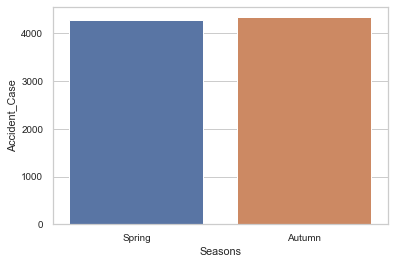

In [77]:
%matplotlib inline
sns.barplot(data=df_group_daylight,x='Seasons',y='Accident_Case')

# E) Impact of sunrise and sunset on road accidents

Add new columns to filter sunrise time and sunset time because sunrise and sunset time are different every month.

January sunrise 	07:57 am, sunset	04:22 pm

February sunrise	07:12 am, sunset	05:16 pm	

March sunrise	    06:12 am, sunset	06:06 pm	

April sunrise    	06:02 am, sunset	07:58 pm	

May sunrise	        05:06 am, sunset	08:47 pm	

June sunrise	    04:40 am, sunset	09:21 pm	

July sunrise     	04:59 am, sunset	09:13 pm	

August sunrise   	05:44 am, sunset	08:25 pm	

September sunrise	06:33 am, sunset	07:17 pm	

October sunrise  	07:22 am, sunset	06:09 pm	

November sunrise	07:16 am, sunset	04:13 pm	

December sunrise	07:57 am, sunset	03:53 pm	

In [78]:
def day_night(df_Accidents):

    if (df_Accidents['Month'] == 1) and ('07:57' <=df_Accidents['Time'] <= '16:22'):
        return 'day'
    if (df_Accidents['Month'] == 2) and ('07:12' <=df_Accidents['Time'] <= '17:16'):
        return 'day'
    if (df_Accidents['Month'] == 3) and ('06:12' <=df_Accidents['Time'] <= '18:06'):
        return 'day'
    if (df_Accidents['Month'] == 4) and ('06:02' <=df_Accidents['Time'] <= '19:58'):
        return 'day'
    if (df_Accidents['Month'] == 5) and ('05:06' <=df_Accidents['Time'] <= '20:47'):
        return 'day'
    if (df_Accidents['Month'] == 6) and ('04:40' <=df_Accidents['Time'] <= '21:21'):
        return 'day'
    if (df_Accidents['Month'] == 7) and ('04:59' <=df_Accidents['Time'] <= '21:13'):
        return 'day'
    if (df_Accidents['Month'] == 8) and ('05:44' <=df_Accidents['Time'] <= '20:25'):
        return 'day'
    if (df_Accidents['Month'] == 9) and ('06:33' <=df_Accidents['Time'] <= '19:17'):
        return 'day'
    if (df_Accidents['Month'] == 10) and ('07:22' <=df_Accidents['Time'] <= '18:09'):
        return 'day'
    if (df_Accidents['Month'] == 11) and ('07:16' <=df_Accidents['Time'] <= '16:13'):
        return 'day'
    if (df_Accidents['Month'] == 12) and ('07:57' <=df_Accidents['Time'] <= '15:53'):
        return 'day'
    else:
        return 'night'

    
    
df_Accidents['Day_night'] = df_Accidents.apply(day_night, axis = 1)

# Sunrise and Sunset average time in each month

Text(0.5, 0, 'Year - Month')

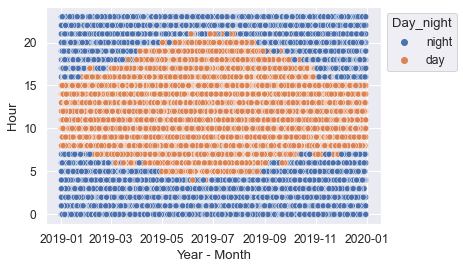

In [79]:
%matplotlib inline
sns.set(font_scale=1.1)
daynight=sns.scatterplot(data=df_Accidents, x = 'Date',y = 'Hour',hue='Day_night')
sns.move_legend(daynight, "upper left", bbox_to_anchor=(1., 1.), title='Day_night')
plt.xlabel('Year - Month')

Add new columns name number of days

This data starts from 01/01/2019. Therefore, Date - 31/12/2018 will get the number of days

For example 01/01/2019 - 31/12/2018 = 1 (First day)

In [80]:
datetime_object = datetime.strptime('2018-12-31', '%Y-%m-%d')
df_Accidents['Date'] = df_Accidents['Date'].apply(pd.to_datetime)
df_Accidents['Number_of_days'] = (df_Accidents['Date'] - datetime_object).dt.days

In [81]:
X=df_Accidents.loc[:,['Number_of_days','Hour']]
X.head(10)

,Number_of_days,Hour
0,49,17
2,1,1
3,1,1
4,1,0
5,1,2
6,1,1
7,1,2
8,1,1
9,1,4
10,1,1


# Sunrise

Focus on the sunrise time from 04:00 to 08:00 because the first sunrise start at 04:40 in June and the last sunrise start at 07:57 in January and December

In [82]:
sunrise = df_Accidents.loc[(df_Accidents['Time'] >= '04:00')
                     & (df_Accidents['Time'] <= '08:00')]

Month against Sunrise period conditioned by day and night

<AxesSubplot:xlabel='Month', ylabel='Hour'>

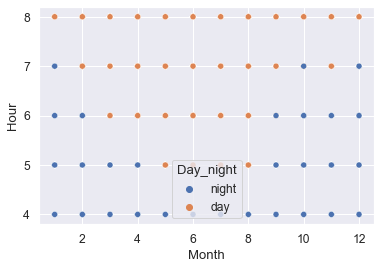

In [83]:
%matplotlib inline
sns.scatterplot(data=sunrise, x = 'Month',y = 'Hour',hue='Day_night')

Use Kmeans clustering and n_cluster = 10

In [84]:
model=KMeans(n_clusters=10)
model

KMeans(n_clusters=10)

Focus on each month against Hour from 04:00 to 08:00

In [85]:
X=sunrise[['Month','Hour']]
model.fit(X)

KMeans(n_clusters=10)

In [86]:
model.cluster_centers_

array([[ 3.50820954,  6.71540266],
       [ 9.5908727 ,  6.90632506],
       [ 7.41450313,  6.93196061],
       [10.97797927,  5.06217617],
       [ 6.04433498,  4.57389163],
       [ 2.08303249,  4.54693141],
       [ 1.43118069,  6.79973907],
       [11.50710109,  6.93149541],
       [ 5.45093458,  6.84190031],
       [ 8.47752809,  5.35533708]])

# Sunrise accident cluster

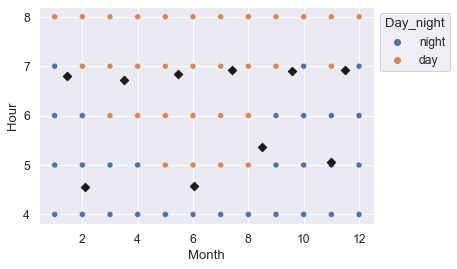

In [87]:
%matplotlib inline
dn=sns.scatterplot(data=sunrise, x = 'Month',y = 'Hour',hue='Day_night')
sns.move_legend(dn, "upper left", bbox_to_anchor=(1., 1.), title='Day_night')
sunrise_cluster = plt.scatter(model.cluster_centers_[:,0], model.cluster_centers_[:, 1], color='.1',marker='D')
sunrise_cluster

# Check inertia

After k = 10 inertia is decreasing slightly. Finally, the best k is k = 10

[[1, 138085.19707017703], [2, 40101.10280380515], [3, 23125.500011434448], [4, 17147.371052557504], [5, 15068.979370811969], [6, 13021.836434263334], [7, 11016.728053865738], [8, 9323.134789821012], [9, 8261.060196804467], [10, 6968.748805742215], [11, 6522.418623512456], [12, 5776.136871612647], [13, 5378.964220839103], [14, 5018.917169978439], [15, 4719.4037651283115], [16, 4383.246834145872], [17, 4215.901561521416], [18, 3992.4049761289266], [19, 3490.6415038139294], [20, 3125.3886858314545]]


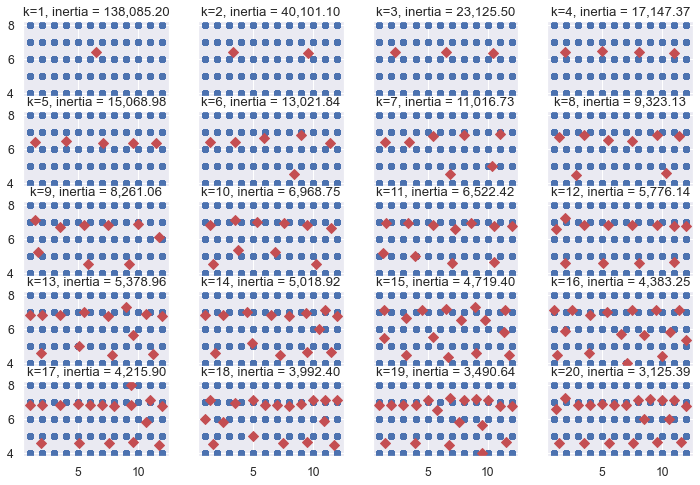

In [88]:
%matplotlib inline
fig, ax =plt.subplots(5,4, figsize=(12,8), sharex=True, sharey = True)
k=1
ssd=[]
for r in range(ax.shape[0]):
    for c in range(ax.shape[1]):
        ax[r,c].scatter(data=sunrise, x = 'Month',y = 'Hour')
        m=KMeans(n_clusters=k)
        m.fit(X)
        ssd.append([k,m.inertia_])
        ax[r, c].scatter(m.cluster_centers_[:,0], m.cluster_centers_[:,1],color='r',marker='D',s=50)
        ax[r, c].set_title(f'k={k}, inertia = {m.inertia_:,.2f}')
        k+=1
print(ssd)

In [89]:
xy=np.array(ssd)
print(xy)

[[1.00000000e+00 1.38085197e+05]
 [2.00000000e+00 4.01011028e+04]
 [3.00000000e+00 2.31255000e+04]
 [4.00000000e+00 1.71473711e+04]
 [5.00000000e+00 1.50689794e+04]
 [6.00000000e+00 1.30218364e+04]
 [7.00000000e+00 1.10167281e+04]
 [8.00000000e+00 9.32313479e+03]
 [9.00000000e+00 8.26106020e+03]
 [1.00000000e+01 6.96874881e+03]
 [1.10000000e+01 6.52241862e+03]
 [1.20000000e+01 5.77613687e+03]
 [1.30000000e+01 5.37896422e+03]
 [1.40000000e+01 5.01891717e+03]
 [1.50000000e+01 4.71940377e+03]
 [1.60000000e+01 4.38324683e+03]
 [1.70000000e+01 4.21590156e+03]
 [1.80000000e+01 3.99240498e+03]
 [1.90000000e+01 3.49064150e+03]
 [2.00000000e+01 3.12538869e+03]]


# Check elbow

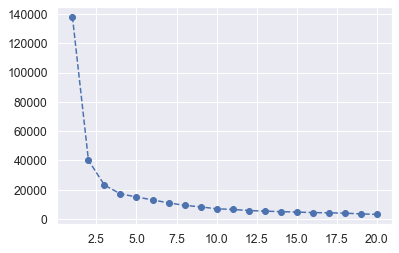

In [90]:
%matplotlib inline
plt.plot(xy[:,0], xy[:,1], linestyle='--',marker='o')

# Sunset

Focus on the sunset time from 15:00 to 22:00 because the first sunset start at 15:53 in December and the last sunset start at 21:21 in June

In [91]:
sunset = df_Accidents.loc[(df_Accidents['Time'] >= '15:00')
                     & (df_Accidents['Time'] <= '22:00')]

Month against Sunrise period conditioned by day and night

<AxesSubplot:xlabel='Month', ylabel='Hour'>

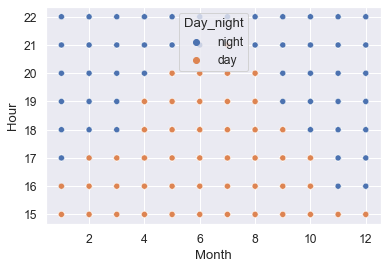

In [92]:
%matplotlib inline
sns.scatterplot(data=sunset, x = 'Month',y = 'Hour',hue='Day_night')

Use Kmeans clustering and n_cluster = 13

In [93]:
model=KMeans(n_clusters=13)
model

KMeans(n_clusters=13)

Focus on each month against Hour from 15:00 to 22:00

In [94]:
X=sunset[['Month','Hour']]
model.fit(X)

KMeans(n_clusters=13)

In [95]:
model.cluster_centers_

array([[ 9.15040119, 15.71991043],
       [ 3.26339419, 17.52648908],
       [ 6.75411008, 17.89671194],
       [10.96394942, 18.43987086],
       [ 1.9866548 , 19.87752076],
       [ 5.02300799, 19.5478324 ],
       [ 5.85687264, 15.8981715 ],
       [ 1.31328089, 16.50971772],
       [11.45025432, 16.091353  ],
       [ 8.49488491, 17.82736573],
       [ 7.99905303, 20.54450758],
       [ 3.21135561, 15.40369465],
       [10.9895073 , 20.50638686]])

# Sunset accident cluster

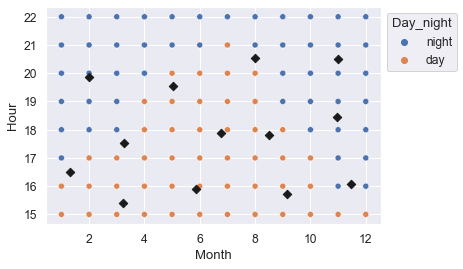

In [96]:
%matplotlib inline
dn=sns.scatterplot(data=sunset, x = 'Month',y = 'Hour',hue='Day_night')
sns.move_legend(dn, "upper left", bbox_to_anchor=(1., 1.), title='Day_night')
sunset_cluster = plt.scatter(model.cluster_centers_[:,0], model.cluster_centers_[:, 1], color='.1',marker='D')
sunset_cluster

# Check inertia

After k = 13 inertia is decreasing slightly. Finally, the best k is k = 13

[[1, 763955.304231758], [2, 318432.7002967874], [3, 234171.57120033228], [4, 184612.16986562102], [5, 136871.44213101658], [6, 109877.9916399384], [7, 92920.06784019821], [8, 86543.94942453293], [9, 77072.12397271475], [10, 70309.34583502138], [11, 62583.15676911088], [12, 57568.01534130128], [13, 51545.61283666882], [14, 48154.90039209503], [15, 43863.327256328215], [16, 42869.870006856945], [17, 37925.41377892942], [18, 37047.52875526726], [19, 34810.45356392968], [20, 32826.53002620752]]


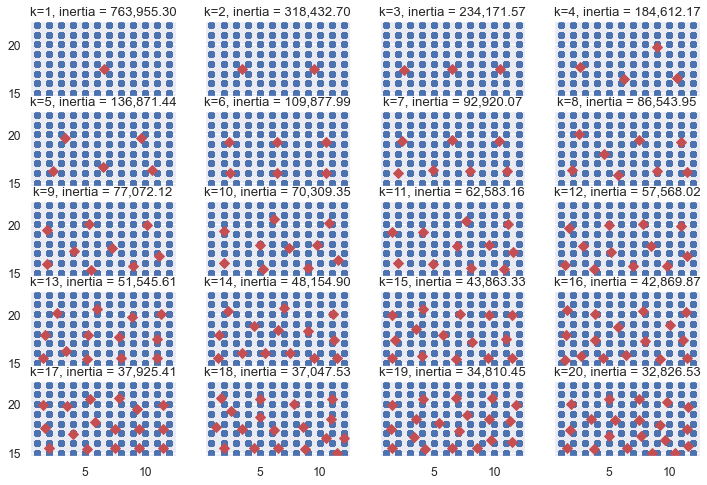

In [97]:
%matplotlib inline
fig, ax =plt.subplots(5,4, figsize=(12,8), sharex=True, sharey = True)
k=1
ssd=[]
for r in range(ax.shape[0]):
    for c in range(ax.shape[1]):
        ax[r,c].scatter(data=sunset, x = 'Month',y = 'Hour')
        m=KMeans(n_clusters=k)
        m.fit(X)
        ssd.append([k,m.inertia_])
        ax[r, c].scatter(m.cluster_centers_[:,0], m.cluster_centers_[:,1],color='r',marker='D',s=50)
        ax[r, c].set_title(f'k={k}, inertia = {m.inertia_:,.2f}')
        k+=1
print(ssd)

In [98]:
xy=np.array(ssd)
print(xy)

[[1.00000000e+00 7.63955304e+05]
 [2.00000000e+00 3.18432700e+05]
 [3.00000000e+00 2.34171571e+05]
 [4.00000000e+00 1.84612170e+05]
 [5.00000000e+00 1.36871442e+05]
 [6.00000000e+00 1.09877992e+05]
 [7.00000000e+00 9.29200678e+04]
 [8.00000000e+00 8.65439494e+04]
 [9.00000000e+00 7.70721240e+04]
 [1.00000000e+01 7.03093458e+04]
 [1.10000000e+01 6.25831568e+04]
 [1.20000000e+01 5.75680153e+04]
 [1.30000000e+01 5.15456128e+04]
 [1.40000000e+01 4.81549004e+04]
 [1.50000000e+01 4.38633273e+04]
 [1.60000000e+01 4.28698700e+04]
 [1.70000000e+01 3.79254138e+04]
 [1.80000000e+01 3.70475288e+04]
 [1.90000000e+01 3.48104536e+04]
 [2.00000000e+01 3.28265300e+04]]


# Check elbow

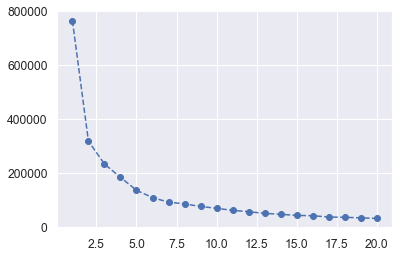

In [99]:
%matplotlib inline
plt.plot(xy[:,0], xy[:,1], linestyle='--',marker='o')

# F) Types of vehicles involved on road with accident severity

Resizing and grouping 

Filter string contains motorcycle change to motorcycle

Filter string contains car change to car

Filter string contains bus change to bus

Filter string contains goods change to goods

In [100]:
df_Vehicles.loc[df_Vehicles.Name_of_vehicle.str.contains("Motorcycle"), "Name_of_vehicle"] = "Motorcycle"
df_Vehicles.loc[df_Vehicles.Name_of_vehicle.str.contains("motorcycle"), "Name_of_vehicle"] = "Motorcycle"
df_Vehicles.loc[df_Vehicles.Name_of_vehicle.str.contains("car"), "Name_of_vehicle"] = "Car"
df_Vehicles.loc[df_Vehicles.Name_of_vehicle.str.contains("bus"), "Name_of_vehicle"] = "Bus"
df_Vehicles.loc[df_Vehicles.Name_of_vehicle.str.contains("Bus"), "Name_of_vehicle"] = "Bus"
df_Vehicles.loc[df_Vehicles.Name_of_vehicle.str.contains("Goods"), "Name_of_vehicle"] = "Goods"

Merge data that have already been grouped

In [101]:
dfVehicle_Accident_grouping=pd.merge(df_Accidents,df_Vehicles,how='inner',on='Accident_Index')
dfVehicle_Accident_grouping

,Accident_Index,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,...,Age_of_Driver,Age_Band_of_Driver,Engine_Capacity_(CC),Propulsion_Code,Age_of_Vehicle,Driver_IMD_Decile,Driver_Home_Area_Type,Vehicle_IMD_Decile,Sex of Driver,Name_of_vehicle
0,2019010128300,-0.153842,51.508057,1,3,2,3,2019-02-18,2,17:50,...,58,9,-1,-1,-1,2,1,2,Male,Car
1,2019010155191,-0.124193,51.526795,1,3,2,1,2019-01-01,3,01:50,...,45,7,-1,-1,-1,4,1,4,Male,Car
2,2019010155191,-0.124193,51.526795,1,3,2,1,2019-01-01,3,01:50,...,33,6,-1,-1,-1,-1,-1,-1,Male,Pedal cycle
3,2019010155192,-0.191044,51.546387,1,2,1,1,2019-01-01,3,01:20,...,32,6,-1,-1,-1,3,1,3,Male,Car
4,2019010155194,-0.200064,51.541121,1,3,2,2,2019-01-01,3,00:40,...,47,8,-1,-1,-1,3,1,3,Female,Car
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151490,2019984107019,-2.983499,55.215407,98,3,4,1,2019-05-30,5,08:46,...,20,4,2198,2,4,5,3,5,Male,Goods
151491,2019984107219,-3.274645,54.991685,98,3,2,1,2019-06-21,6,15:30,...,33,6,1997,2,12,3,2,3,Male,Car
151492,2019984107219,-3.274645,54.991685,98,3,2,1,2019-06-21,6,15:30,...,61,9,2967,2,5,7,3,7,Male,Car
151493,2019984107419,-2.997491,55.148292,98,3,1,1,2019-06-29,7,14:10,...,78,11,1597,2,6,8,3,8,Male,Car


# Amount of type of vehicles (table)

In [102]:
Vehicles=dfVehicle_Accident_grouping.groupby(['Name_of_vehicle']).size().reset_index(name='Vehicle count')
Vehicles.sort_values(by='Vehicle count', ascending=False)

,Name_of_vehicle,Vehicle count
2,Car,108576
7,Pedal cycle,13477
5,Motorcycle,13237
3,Goods,11705
1,Bus,3238
6,Other vehicle,674
0,Agricultural vehicle,332
4,Mobility scooter,182
8,Ridden horse,51
9,Tram,23


# Amount of type of vehicles with accident severity (table)

In [103]:
Vehicles = dfVehicle_Accident_grouping.groupby(['Name_of_vehicle','Name of Accident Severity']).size().unstack()
Vehicles['sum'] = Vehicles.sum(axis=1)
Vehicles.sort_values('sum',ascending=False)

Name of Accident Severity,Fatal,Serious,Slight,sum
Name_of_vehicle,,,,
Car,1519.0,19022.0,88035.0,108576.0
Pedal cycle,92.0,3080.0,10305.0,13477.0
Motorcycle,332.0,4433.0,8472.0,13237.0
Goods,389.0,2326.0,8990.0,11705.0
Bus,64.0,611.0,2563.0,3238.0
Other vehicle,24.0,199.0,451.0,674.0
Agricultural vehicle,19.0,116.0,197.0,332.0
Mobility scooter,12.0,33.0,137.0,182.0
Ridden horse,NaN,17.0,34.0,51.0


# Amount of type of vehicles with accident severity

<AxesSubplot:xlabel='count', ylabel='Name_of_vehicle'>

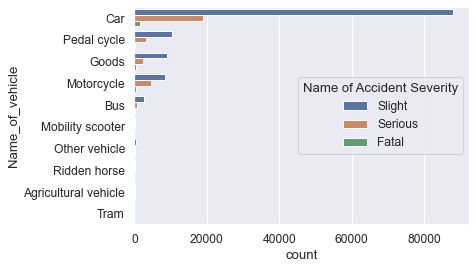

In [104]:
%matplotlib inline
sns.countplot(y='Name_of_vehicle',hue='Name of Accident Severity', data=dfVehicle_Accident_grouping)

# Resizing and grouping

It's difficult to read the small data

Change small data to other vehicles such as Tram, Agricultural vehicle, Mobility scooter and Ridden horse

In [105]:
dfVehicle_Accident_grouping.loc[dfVehicle_Accident_grouping.Name_of_vehicle.str.contains("Tram"), "Name_of_vehicle"] = "Other vehicle"
dfVehicle_Accident_grouping.loc[dfVehicle_Accident_grouping.Name_of_vehicle.str.contains("Agricultural vehicle"), "Name_of_vehicle"] = "Other vehicle"
dfVehicle_Accident_grouping.loc[dfVehicle_Accident_grouping.Name_of_vehicle.str.contains("Mobility scooter"), "Name_of_vehicle"] = "Other vehicle"
dfVehicle_Accident_grouping.loc[dfVehicle_Accident_grouping.Name_of_vehicle.str.contains("Ridden horse"), "Name_of_vehicle"] = "Other vehicle"

# Amount type of car updated (table)

In [106]:
Vehicles=dfVehicle_Accident_grouping.groupby(['Name_of_vehicle']).size().reset_index(name='Vehicle count')
Vehicles.sort_values(by='Vehicle count', ascending=False)

,Name_of_vehicle,Vehicle count
1,Car,108576
5,Pedal cycle,13477
3,Motorcycle,13237
2,Goods,11705
0,Bus,3238
4,Other vehicle,1262


# Amount type of car with accident severity updated (table)

In [107]:
Vehicles = dfVehicle_Accident_grouping.groupby(['Name_of_vehicle','Name of Accident Severity']).size().unstack()
Vehicles['sum'] = Vehicles.sum(axis=1)
Vehicles.sort_values('sum',ascending=False)

Name of Accident Severity,Fatal,Serious,Slight,sum
Name_of_vehicle,,,,
Car,1519,19022,88035,108576
Pedal cycle,92,3080,10305,13477
Motorcycle,332,4433,8472,13237
Goods,389,2326,8990,11705
Bus,64,611,2563,3238
Other vehicle,57,373,832,1262


# Amount type of car with accident severity updated

<AxesSubplot:xlabel='count', ylabel='Name_of_vehicle'>

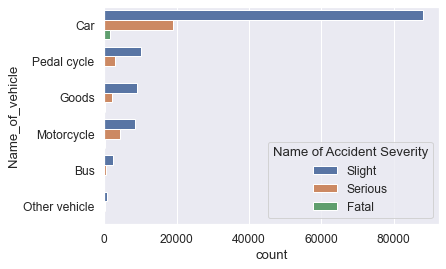

In [108]:
%matplotlib inline
sns.countplot(y='Name_of_vehicle',hue='Name of Accident Severity', data=dfVehicle_Accident_grouping)

# Plot outliers of age of vehicle and engine capacity

#### Age more than 60 years old are outliers

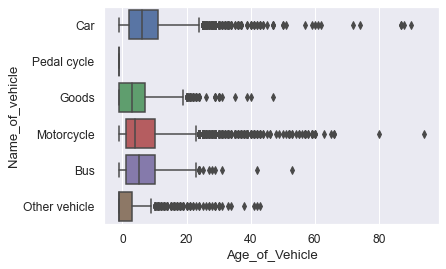

In [109]:
%matplotlib inline
Age_vehicle=sns.boxplot(data=dfVehicle_Accident_grouping,x ='Age_of_Vehicle',y='Name_of_vehicle')
plt.show()

#### Engine capacity of more than 18000 are outliers

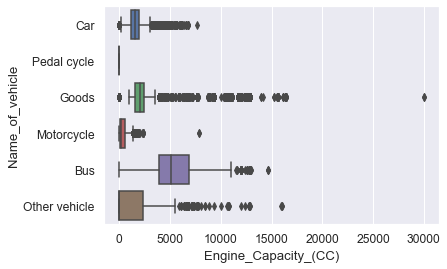

In [110]:
%matplotlib inline
Age_vehicle=sns.boxplot(data=dfVehicle_Accident_grouping,x ='Engine_Capacity_(CC)',y='Name_of_vehicle')
plt.show()

Remove -1 because -1 is out of range. It can be seen that vehicles such as pedal cycles are no engine capacity. Therefore it should have been removed.

In [111]:
dfVehicle_Accident_grouping=dfVehicle_Accident_grouping.replace(-1, np.nan)
dfVehicle_Accident_grouping.dropna(inplace=True)

# Remove outliers of age of vehicle and engine capacity

In [112]:
Vehicle_Engine_Capacity = (dfVehicle_Accident_grouping['Engine_Capacity_(CC)'] <= 18000) 

dfVehicle_Accident_grouping = dfVehicle_Accident_grouping[Vehicle_Engine_Capacity]

dfVehicle_Accident_grouping['Engine_Capacity_(CC)']

136        1388.0
153        1798.0
322        2143.0
359         124.0
360        1798.0
           ...   
151476     1598.0
151477    12902.0
151491     1997.0
151492     2967.0
151493     1597.0
Name: Engine_Capacity_(CC), Length: 56288, dtype: float64

In [113]:
Vehicle_Engine_Capacity = (dfVehicle_Accident_grouping['Age_of_Vehicle'] <= 60) 

dfVehicle_Accident_grouping = dfVehicle_Accident_grouping[Vehicle_Engine_Capacity]

dfVehicle_Accident_grouping['Age_of_Vehicle']

136       14.0
153        7.0
322        1.0
359       11.0
360        1.0
          ... 
151476     7.0
151477     2.0
151491    12.0
151492     5.0
151493     6.0
Name: Age_of_Vehicle, Length: 56282, dtype: float64

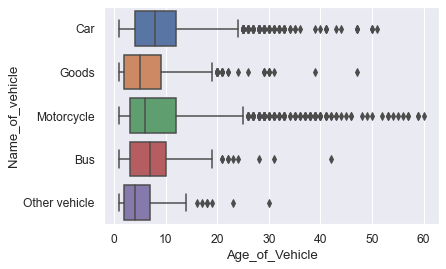

In [114]:
%matplotlib inline
Age_vehicle=sns.boxplot(data=dfVehicle_Accident_grouping,x ='Age_of_Vehicle',y='Name_of_vehicle')

plt.show()

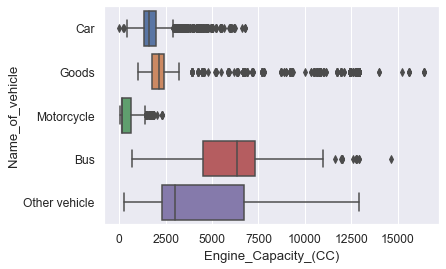

In [115]:
%matplotlib inline
Age_vehicle=sns.boxplot(data=dfVehicle_Accident_grouping,x ='Engine_Capacity_(CC)',y='Name_of_vehicle')

plt.show()

# Age of vehicle against Engine Capacity

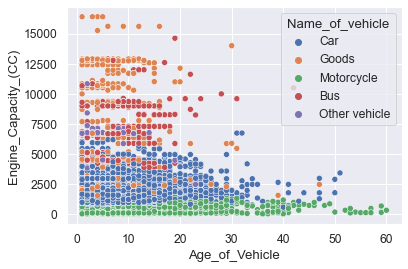

In [116]:
Age_of_Vehicle_Engine_Capacity=sns.scatterplot(data=dfVehicle_Accident_grouping, x = 'Age_of_Vehicle',y = 'Engine_Capacity_(CC)',hue='Name_of_vehicle')

Use Kmeans clustering and n_cluster = 9

In [117]:
model=KMeans(n_clusters=9)
model

KMeans(n_clusters=9)

Focus on each Age_of_Vehicle against Engine_Capacity_(CC)

In [118]:
X=dfVehicle_Accident_grouping[['Age_of_Vehicle','Engine_Capacity_(CC)']]
model.fit(X)

KMeans(n_clusters=9)

In [119]:
model.cluster_centers_

array([[8.43718286e+00, 1.99269548e+03],
       [5.52507375e+00, 1.27912153e+04],
       [7.57635468e+00, 6.80542200e+03],
       [7.94607113e+00, 1.11964971e+03],
       [7.41709903e+00, 2.08663885e+02],
       [6.42857143e+00, 4.54866595e+03],
       [7.77701149e+00, 9.67899080e+03],
       [9.60683112e+00, 2.87192903e+03],
       [8.05115699e+00, 1.50615954e+03]])

# Age of vehicle against engine capacity cluster

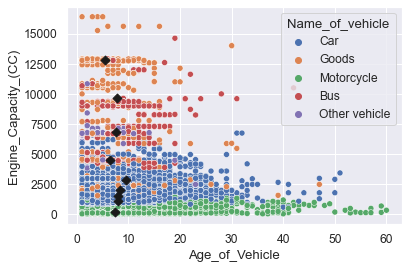

In [120]:
%matplotlib inline
Age_of_Vehicle_Engine_Capacity=sns.scatterplot(data=dfVehicle_Accident_grouping, x = 'Age_of_Vehicle',y = 'Engine_Capacity_(CC)',hue='Name_of_vehicle')
plt.scatter(model.cluster_centers_[:,0], model.cluster_centers_[:, 1], color='.1',marker='D',s=40)
### have a bar chart to see which one is the most number

# Check inertia

After k = 9 inertia is decreasing slightly. Finally, the best k is k = 9

[[1, 113979325588.67374], [2, 36074002909.299644], [3, 22884048213.450615], [4, 13097158703.492044], [5, 8265390782.1431465], [6, 5438579013.271946], [7, 3875058744.601904], [8, 2779695488.9014263], [9, 1747252192.9283643], [10, 1429241315.257887], [11, 1124697443.790842], [12, 865489860.4799521], [13, 753348585.6168326], [14, 648881910.5678813], [15, 581052559.6139297]]


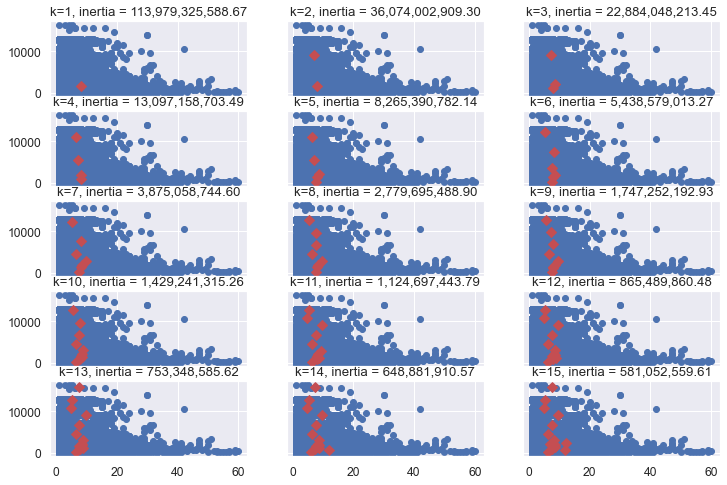

In [121]:
%matplotlib inline
fig, ax =plt.subplots(5,3, figsize=(12,8), sharex=True, sharey = True)
k=1
ssd=[]
for r in range(ax.shape[0]):
    for c in range(ax.shape[1]):
        ax[r,c].scatter(data=dfVehicle_Accident_grouping, x = 'Age_of_Vehicle',y = 'Engine_Capacity_(CC)')
        m=KMeans(n_clusters=k)
        m.fit(X)
        ssd.append([k,m.inertia_])
        ax[r, c].scatter(m.cluster_centers_[:,0], m.cluster_centers_[:,1],color='r',marker='D',s=50)
        ax[r, c].set_title(f'k={k}, inertia = {m.inertia_:,.2f}')
        k+=1
print(ssd)

In [122]:
xy=np.array(ssd)
print(xy)

[[1.00000000e+00 1.13979326e+11]
 [2.00000000e+00 3.60740029e+10]
 [3.00000000e+00 2.28840482e+10]
 [4.00000000e+00 1.30971587e+10]
 [5.00000000e+00 8.26539078e+09]
 [6.00000000e+00 5.43857901e+09]
 [7.00000000e+00 3.87505874e+09]
 [8.00000000e+00 2.77969549e+09]
 [9.00000000e+00 1.74725219e+09]
 [1.00000000e+01 1.42924132e+09]
 [1.10000000e+01 1.12469744e+09]
 [1.20000000e+01 8.65489860e+08]
 [1.30000000e+01 7.53348586e+08]
 [1.40000000e+01 6.48881911e+08]
 [1.50000000e+01 5.81052560e+08]]


# Check elbow

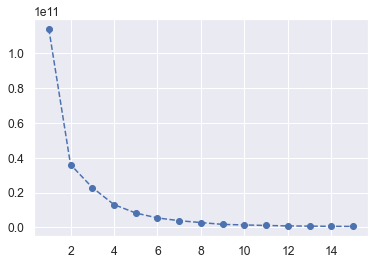

In [123]:
%matplotlib inline
plt.plot(xy[:,0], xy[:,1], linestyle='--',marker='o')

# G) Condition and situation of road accidents

Focus on particular conditions such as Speed_limit, Light_Condition_Situations, Weather_Condition_Situations, Road_Surface_Condition_Situations, Urban_Rural, Name of Accident Severity

In [124]:
Situtations = ['Speed_limit','Light_Condition_Situations','Weather_Condition_Situations',
                 'Road_Surface_Condition_Situations','Urban_Rural','Name of Accident Severity']

6 Bar charts: Speed_limit, Light_Condition_Situations, Weather_Condition_Situations, Road_Surface_Condition_Situations, Urban_Rural, Name of Accident Severity

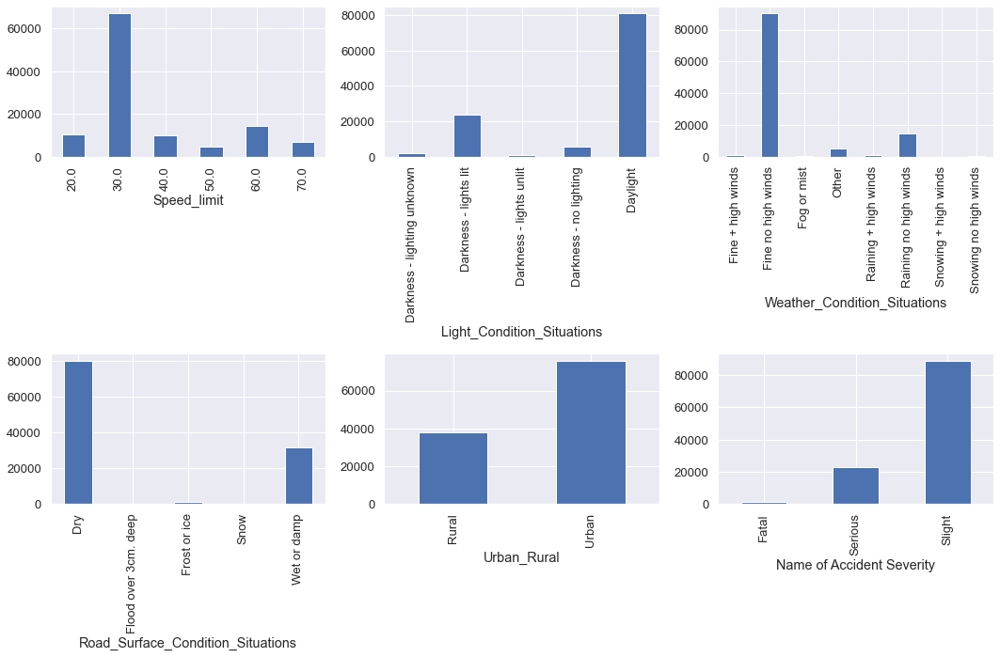

In [125]:
%matplotlib inline
sns.set(font_scale=1.2)
plt.figure(figsize=(15,10))
counter = 0
for i in Situtations:
    plt.subplot(2,3,counter+1)
    plt.xticks(rotation='vertical')
    df_Accidents[i].groupby(df_Accidents[i]).count().plot(kind="bar")
    counter = counter + 1
plt.tight_layout()
plt.show()


Change weather, road surface, light condition to one-hot encoding

In [126]:
Weather=pd.get_dummies(data=df_Accidents['Weather_Condition_Situations'],prefix='Weather')
Road_Surface=pd.get_dummies(data=df_Accidents['Road_Surface_Condition_Situations'],prefix='Road')
Light_Condition=pd.get_dummies(data=df_Accidents['Light_Condition_Situations'],prefix='Light')

Concatenate data: weather, road surface and light condition

In [127]:
Weather_Road_Surface_Light_Condition = pd.concat([Weather,Road_Surface,Light_Condition], axis=1)

# Frequent accident ranking by support

In [128]:
frequent_accident = apriori(Weather_Road_Surface_Light_Condition, min_support = 0.05, use_colnames = True)
frequent_accident.sort_values('support',ascending=False)[:10]

,support,itemsets
0,0.793669,(Weather_Fine no high winds)
6,0.711570,(Light_Daylight)
2,0.706621,(Road_Dry)
7,0.669543,"(Road_Dry, Weather_Fine no high winds)"
10,0.593828,"(Light_Daylight, Weather_Fine no high winds)"
14,0.550735,"(Light_Daylight, Road_Dry)"
18,0.523959,"(Light_Daylight, Road_Dry, Weather_Fine no hig..."
3,0.279317,(Road_Wet or damp)
4,0.208259,(Light_Darkness - lights lit)
16,0.153315,"(Light_Daylight, Road_Wet or damp)"


# Frequent accident ranking by lift

In [129]:
rules = association_rules(frequent_accident,metric = "lift",min_threshold=3.0)
rules.sort_values('lift',ascending=False)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
2,"(Light_Daylight, Road_Wet or damp)",(Weather_Raining no high winds),0.153315,0.131417,0.070151,0.457558,3.481733,0.050002,1.601246
5,(Weather_Raining no high winds),"(Light_Daylight, Road_Wet or damp)",0.131417,0.153315,0.070151,0.533802,3.481733,0.050002,1.816150
0,(Road_Wet or damp),(Weather_Raining no high winds),0.279317,0.131417,0.127419,0.456182,3.471261,0.090712,1.597194
1,(Weather_Raining no high winds),(Road_Wet or damp),0.131417,0.279317,0.127419,0.969581,3.471261,0.090712,23.692066
4,(Road_Wet or damp),"(Light_Daylight, Weather_Raining no high winds)",0.279317,0.072713,0.070151,0.251151,3.454005,0.049841,1.238283
3,"(Light_Daylight, Weather_Raining no high winds)",(Road_Wet or damp),0.072713,0.279317,0.070151,0.964761,3.454005,0.049841,20.451555


# G) The most accident severity location on highways

In [130]:
Accident_Area = df_Accidents.groupby(['Local_Authority_(Highway)','Name of Accident Severity']).size().unstack()
Accident_Area['sum'] = Accident_Area.sum(axis=1)
Accident_Area.sort_values('sum',ascending=False)[:10]

Name of Accident Severity,Fatal,Serious,Slight,sum
Local_Authority_(Highway),,,,
E10000016,36.0,658.0,2911.0,3605.0
E10000030,27.0,649.0,2285.0,2961.0
E08000025,14.0,410.0,2189.0,2613.0
E10000014,33.0,586.0,1766.0,2385.0
E10000012,38.0,655.0,1691.0,2384.0
E10000017,38.0,683.0,1583.0,2304.0
E10000032,26.0,499.0,1456.0,1981.0
E10000015,24.0,354.0,1571.0,1949.0
E10000019,48.0,405.0,1436.0,1889.0


Change name

In [131]:
df_Accidents['Local_Authority_(Highway)'] = df_Accidents['Local_Authority_(Highway)'].replace('E10000016', "Kent")
df_Accidents['Local_Authority_(Highway)'] = df_Accidents['Local_Authority_(Highway)'].replace('E10000030', "Surrey")
df_Accidents['Local_Authority_(Highway)'] = df_Accidents['Local_Authority_(Highway)'].replace('E08000025', "Birmingham")
df_Accidents['Local_Authority_(Highway)'] = df_Accidents['Local_Authority_(Highway)'].replace('E10000012', "Essex")
df_Accidents['Local_Authority_(Highway)'] = df_Accidents['Local_Authority_(Highway)'].replace('E10000014', "Hampshire")
df_Accidents['Local_Authority_(Highway)'] = df_Accidents['Local_Authority_(Highway)'].replace('E10000017', "Lancashire")
df_Accidents['Local_Authority_(Highway)'] = df_Accidents['Local_Authority_(Highway)'].replace('E10000032', "West Sussex")
df_Accidents['Local_Authority_(Highway)'] = df_Accidents['Local_Authority_(Highway)'].replace('E10000015', "Hertfordshire")
df_Accidents['Local_Authority_(Highway)'] = df_Accidents['Local_Authority_(Highway)'].replace('E10000019', "Lincolnshire")
df_Accidents['Local_Authority_(Highway)'] = df_Accidents['Local_Authority_(Highway)'].replace('E10000020', "Norfolk")

# Frequent accident highway ranking updated

In [132]:
Accident_Area = df_Accidents.groupby(['Local_Authority_(Highway)','Name of Accident Severity']).size().unstack()
Accident_Area['sum'] = Accident_Area.sum(axis=1)
Accident_Area.sort_values('sum',ascending=False)[:10]

Name of Accident Severity,Fatal,Serious,Slight,sum
Local_Authority_(Highway),,,,
Kent,36.0,658.0,2911.0,3605.0
Surrey,27.0,649.0,2285.0,2961.0
Birmingham,14.0,410.0,2189.0,2613.0
Hampshire,33.0,586.0,1766.0,2385.0
Essex,38.0,655.0,1691.0,2384.0
Lancashire,38.0,683.0,1583.0,2304.0
West Sussex,26.0,499.0,1456.0,1981.0
Hertfordshire,24.0,354.0,1571.0,1949.0
Lincolnshire,48.0,405.0,1436.0,1889.0


# UK map with accident severity

<AxesSubplot:xlabel='Longitude', ylabel='Latitude'>

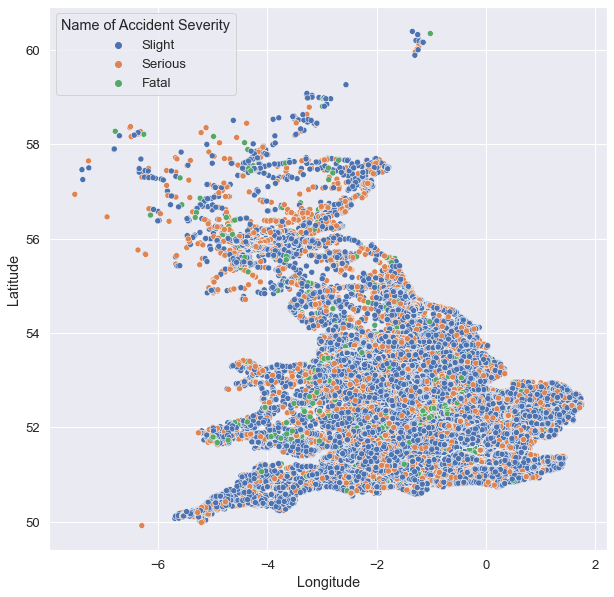

In [133]:
%matplotlib inline
plt.figure(figsize=(10,10))
sns.scatterplot(data=df_Accidents, x = 'Longitude',y = 'Latitude',hue='Name of Accident Severity')

Use Kmeans clustering and n_cluster = 10

In [134]:
model=KMeans(n_clusters=10)
model

KMeans(n_clusters=10)

Focus on each Longitude and Latitude

In [135]:
X=df_Accidents[['Longitude','Latitude']]
model.fit(X)

KMeans(n_clusters=10)

In [136]:
model.cluster_centers_

array([[-0.38192157, 53.2687618 ],
       [-0.15494644, 51.49426563],
       [-2.76641084, 51.48631151],
       [-2.67829369, 53.54285807],
       [-3.77126043, 56.10733393],
       [-1.6380299 , 52.63364359],
       [-1.31120738, 51.13005112],
       [-4.20918001, 50.87052227],
       [-1.50835836, 54.1462613 ],
       [ 0.9134469 , 51.82776199]])

# UK map with accident severity cluster

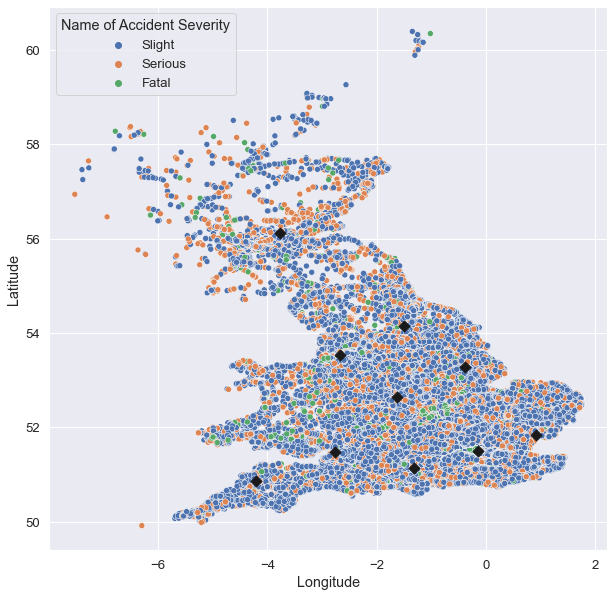

In [137]:
%matplotlib inline
plt.figure(figsize=(10,10))
sns.scatterplot(data=df_Accidents, x = 'Longitude',y = 'Latitude',hue='Name of Accident Severity')
plt.scatter(model.cluster_centers_[:,0], model.cluster_centers_[:, 1], color='.1',marker='D',s=60)
### have a bar chart to see which one is the most number

After k = 10 inertia is decreasing slightly. Finally, the best k is k = 10

[[1, 436215.41992637864], [2, 223856.5693023642], [3, 147177.5825023001], [4, 94247.2866230268], [5, 77883.56779228775], [6, 63650.53293339284], [7, 54366.96718643153], [8, 46076.15706594261], [9, 40506.28258614157], [10, 35933.77809510464], [11, 32269.0457944623], [12, 29858.12166106896], [13, 27581.616623449496], [14, 25351.189543457745], [15, 23317.502275784875]]


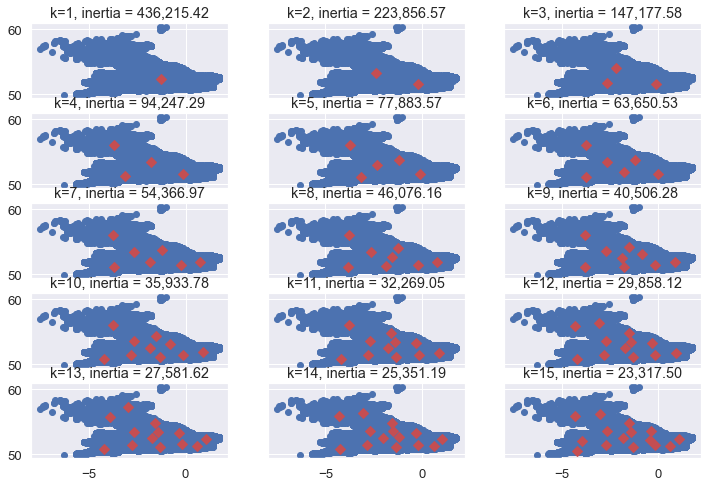

In [138]:
%matplotlib inline
fig, ax =plt.subplots(5,3, figsize=(12,8), sharex=True, sharey = True)
k=1
ssd=[]
for r in range(ax.shape[0]):
    for c in range(ax.shape[1]):
        ax[r,c].scatter(data=df_Accidents, x = 'Longitude',y = 'Latitude')
        m=KMeans(n_clusters=k)
        m.fit(X)
        ssd.append([k,m.inertia_])
        ax[r, c].scatter(m.cluster_centers_[:,0], m.cluster_centers_[:,1],color='r',marker='D',s=50)
        ax[r, c].set_title(f'k={k}, inertia = {m.inertia_:,.2f}')
        k+=1
print(ssd)

In [139]:
xy=np.array(ssd)
print(xy)

[[1.00000000e+00 4.36215420e+05]
 [2.00000000e+00 2.23856569e+05]
 [3.00000000e+00 1.47177583e+05]
 [4.00000000e+00 9.42472866e+04]
 [5.00000000e+00 7.78835678e+04]
 [6.00000000e+00 6.36505329e+04]
 [7.00000000e+00 5.43669672e+04]
 [8.00000000e+00 4.60761571e+04]
 [9.00000000e+00 4.05062826e+04]
 [1.00000000e+01 3.59337781e+04]
 [1.10000000e+01 3.22690458e+04]
 [1.20000000e+01 2.98581217e+04]
 [1.30000000e+01 2.75816166e+04]
 [1.40000000e+01 2.53511895e+04]
 [1.50000000e+01 2.33175023e+04]]


# Check Elbow

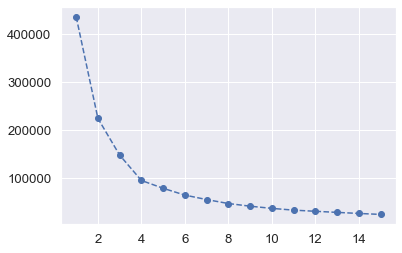

In [140]:
%matplotlib inline
plt.plot(xy[:,0], xy[:,1], linestyle='--',marker='o')

# H) Driver variables affect the outcome

Focus on driver related variables affect the outcome such as Sex_of_Driver,  Age_of_Driver, Journey_Purpose_of_Driver, Driver_IMD_Decile, Driver_Home_Area_Type

In [141]:
driver_predictors= ["Sex_of_Driver", "Age_of_Driver", "Journey_Purpose_of_Driver",'Driver_IMD_Decile','Driver_Home_Area_Type']

Filter value more than 0 because value “-1” is exported for NULL or out of range values.

In [142]:
driverusethis = dfVehicle_Accident_grouping.dropna()
driverusethis.reset_index(drop=True)
driverusethis = driverusethis.filter(["Sex_of_Driver", "Age_of_Driver", "Journey_Purpose_of_Driver","Name of Accident Severity",'Driver_IMD_Decile','Driver_Home_Area_Type'], axis=1)
driverusethisnow = driverusethis[(driverusethis["Sex_of_Driver"]>0) & (driverusethis["Age_of_Driver"]>0)
                     & (driverusethis["Journey_Purpose_of_Driver"]>0)& (driverusethis['Driver_IMD_Decile']>0)
                     & (driverusethis['Driver_Home_Area_Type']>0)&(driverusethis["Name of Accident Severity"])]
driverusethisnow

,Sex_of_Driver,Age_of_Driver,Journey_Purpose_of_Driver,Name of Accident Severity,Driver_IMD_Decile,Driver_Home_Area_Type
136,1,40.0,6.0,Serious,5.0,1.0
153,1,48.0,1.0,Slight,3.0,1.0
322,1,46.0,2.0,Fatal,6.0,1.0
359,2,55.0,6.0,Slight,4.0,1.0
360,1,27.0,6.0,Slight,4.0,1.0
...,...,...,...,...,...,...
151476,1,79.0,5.0,Fatal,8.0,2.0
151477,1,29.0,1.0,Fatal,4.0,3.0
151491,1,33.0,6.0,Slight,3.0,2.0
151492,1,61.0,6.0,Slight,7.0,3.0


# Feature importance of driver

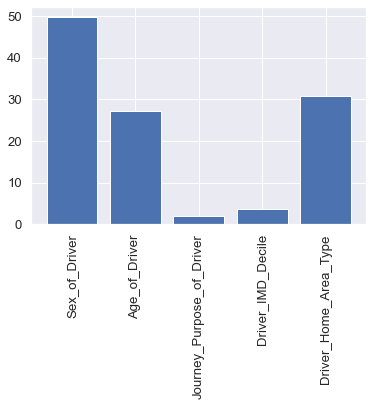

In [143]:
%matplotlib inline
#change y-axis to 100 is probability
# Perform the feature selection
selector = SelectKBest(f_classif, k="all")
selector.fit(driverusethisnow[driver_predictors], driverusethisnow["Name of Accident Severity"])
# Here we will get the p-values for each feature and then transform from p-values into some scores
scores = -np.log10(selector.pvalues_)
# Use plt to plot the scores!  
plt.bar(range(len(driver_predictors)), scores)
plt.xticks(range(len(driver_predictors)), driver_predictors, rotation='vertical')
plt.show()

# Age pyramid of driver

In [144]:
%matplotlib inline
bins=[0,16,21,26,31,36,41,46,51,56,61,66,71,76,81,86,110]
labels=['0-15','16-20','21-25','26-30','31-35','36-40','41-45','46-50','51-55','56-60','61-65','66-70','71-75','76-80','81-85','86+']
df_Vehicles['Age_of_Driver_range'] = pd.cut(df_Vehicles['Age_of_Driver'],bins=bins,labels=labels,right=False)
population=df_Vehicles.groupby(['Age_of_Driver_range','Sex of Driver']).size().unstack('Sex of Driver')
population['Age_of_Driver_range']=population.index.get_level_values(0).tolist()
y_age = population['Age_of_Driver_range']
Maleplot = population['Male']
Femaleplot = population['Female']*-1
fig=go.Figure()
fig.add_trace(go.Bar(y=y_age,x=Maleplot,name='Male',orientation ='h',marker=dict(color='darkolivegreen')))
fig.add_trace(go.Bar(y=y_age,x=Femaleplot,name='Female',orientation ='h',marker=dict(color='hotpink')))
fig.update_layout(title= 'Age and Sex of Driver',title_font_size=18,barmode='overlay',bargap=0.1,bargroupgap=0,
                 yaxis=dict(title='Age'),
                 xaxis=dict(tickvals=[-20000,-10000,-5000,-2500,0,2500,5000,10000,20000],
                        ticktext=['-20000',"-10000","-5000","-2500","0","2500","5000","10000","20000"],
                        title = 'Population',title_font_size=10))
fig.show("notebook")

# I) Predictions about when and where accidents will occur accident severity and compared to government model

### Exploration data: my data set vs government data

#### My data (casualty and accident data)

In [145]:
dfCasualty_Accident=pd.merge(df_Accidents,df_Casualties,how='inner',on='Accident_Index')
dfCasualty_Accident

,Accident_Index,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,...,Casualty_Severity,Pedestrian_Location,Pedestrian_Movement,Car_Passenger,Bus_or_Coach_Passenger,Pedestrian_Road_Maintenance_Worker,Casualty_Type,Casualty_Home_Area_Type,Casualty_IMD_Decile,Sex of Casualty
0,2019010128300,-0.153842,51.508057,1,3,2,3,2019-02-18,2,17:50,...,3,0,0,0,0,0,9,1,2,Male
1,2019010128300,-0.153842,51.508057,1,3,2,3,2019-02-18,2,17:50,...,3,0,0,1,0,0,9,1,5,Female
2,2019010128300,-0.153842,51.508057,1,3,2,3,2019-02-18,2,17:50,...,3,0,0,2,0,0,9,1,5,Female
3,2019010155191,-0.124193,51.526795,1,3,2,1,2019-01-01,3,01:50,...,3,0,0,0,0,0,1,1,1,Female
4,2019010155192,-0.191044,51.546387,1,2,1,1,2019-01-01,3,01:20,...,2,5,4,0,0,0,0,1,4,Male
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125243,2019984106919,-3.368899,55.047323,98,3,1,1,2019-05-18,7,01:00,...,3,0,0,0,0,0,19,3,6,Male
125244,2019984107019,-2.983499,55.215407,98,3,4,1,2019-05-30,5,08:46,...,3,0,0,0,0,0,19,1,1,Male
125245,2019984107219,-3.274645,54.991685,98,3,2,1,2019-06-21,6,15:30,...,3,0,0,0,0,0,9,3,7,Male
125246,2019984107419,-2.997491,55.148292,98,3,1,1,2019-06-29,7,14:10,...,3,5,3,0,0,0,0,3,8,Male


#### Govenment data

In [146]:
governmentmodel = pd.read_csv('cas_adjustment_lookup_2019.csv')
governmentmodel

,accident_index,Vehicle_Reference,Casualty_Reference,Adjusted_Serious,Adjusted_Slight,Injury_Based
0,200401BS00001,1,1,0.239280,0.760720,0
1,200401BS00002,1,1,1.000000,0.000000,0
2,200401BS00003,1,1,0.057141,0.942859,0
3,200401BS00003,1,2,0.048599,0.951401,0
4,200401BS00004,1,1,0.187000,0.813000,0
...,...,...,...,...,...,...
3314732,2019984106919,1,1,0.183336,0.816664,0
3314733,2019984107019,1,1,0.074588,0.925412,0
3314734,2019984107219,2,1,0.048524,0.951476,0
3314735,2019984107419,1,1,0.183316,0.816684,0


# Data cleaning

### The idea of comparing two data sets is to try to make information of them to be similar as possible

It can be seen that the name of the accident index between my data and government data are not the same. Therefore, we need to change to the same name before merging. On the other hand, Vehicle_Reference and Casualty_Reference in my data and government data are the same, it may be confused when reading the name of columns after merging. Therefore, changing names is better.

In [147]:
governmentmodel.rename(columns = {'accident_index':'Accident_Index',
                     'Vehicle_Reference':'Government_Vehicle_Reference'
                    ,'Casualty_Reference':'Government_Casualty_Reference'}, inplace = True)

Remove accident severity is Fatal out from my model because the government model doesn't have Fatal

Now the outcomes of accident severity are quite similar such as Serious and Slight

In [148]:
array = ['Serious','Slight']
dfCasualty_Accident=dfCasualty_Accident[dfCasualty_Accident["Name of Accident Severity"].isin(array)]

Focus on when and where related variables affect the outcome such as Day of Week, Day, Month, Hour, Urban or Rural Area, and Local Authority (District)

Filter value more than 0 because value “-1” is exported for NULL or out of range values.

In [149]:
usethis = dfCasualty_Accident.dropna()
usethis.reset_index(drop=True)
usethis = usethis.filter(['Accident_Index','Vehicle_Reference','Casualty_Reference','Day_of_Week','Day','Month','Hour',
                          'Urban_or_Rural_Area','Local_Authority_(District)',"Name of Accident Severity"], axis=1)
                          
usethisnow = usethis[(usethis['Day_of_Week']>0)&(usethis['Day']>0)&(usethis['Month']>0)&(usethis['Hour'])&
                     (usethis['Urban_or_Rural_Area']>0)&(usethis['Local_Authority_(District)']>0)&
                     (usethis['Vehicle_Reference']>0)&(usethis['Casualty_Reference'])&
                     (usethis["Name of Accident Severity"])& (usethis['Accident_Index'])]
usethisnow

,Accident_Index,Vehicle_Reference,Casualty_Reference,Day_of_Week,Day,Month,Hour,Urban_or_Rural_Area,Local_Authority_(District),Name of Accident Severity
0,2019010128300,1,1,2,18,2,17,1,1,Slight
2,2019010128300,1,3,2,18,2,17,1,1,Slight
3,2019010155191,2,1,3,1,1,1,1,2,Slight
4,2019010155192,1,1,3,1,1,1,1,2,Serious
10,2019010155196,1,1,3,1,1,1,1,20,Slight
...,...,...,...,...,...,...,...,...,...,...
125237,2019984106019,1,1,1,5,12,11,2,917,Serious
125240,2019984106719,1,1,3,21,5,19,2,917,Serious
125241,2019984106819,2,1,5,30,5,17,2,917,Slight
125243,2019984106919,1,1,7,18,5,1,2,917,Slight


Compare two data sets, merging my data and government data connect by accident index and use inner join, the number of rows of two data sets should equal

In [150]:
df=pd.merge(usethisnow,governmentmodel,how='inner',on='Accident_Index')
df

,Accident_Index,Vehicle_Reference,Casualty_Reference,Day_of_Week,Day,Month,Hour,Urban_or_Rural_Area,Local_Authority_(District),Name of Accident Severity,Government_Vehicle_Reference,Government_Casualty_Reference,Adjusted_Serious,Adjusted_Slight,Injury_Based
0,2019040853505,2,1,3,6,11,17,1,72,Slight,2,1,0.000000,1.000000,1
1,2019040853507,2,1,4,6,12,9,2,84,Slight,2,1,0.000000,1.000000,1
2,2019040853510,2,1,4,6,12,15,2,70,Slight,1,2,0.000000,1.000000,1
3,2019040853510,2,1,4,6,12,15,2,70,Slight,2,1,0.000000,1.000000,1
4,2019040853510,2,1,4,6,12,15,2,70,Slight,3,3,0.000000,1.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52281,2019984106719,1,1,3,21,5,19,2,917,Serious,1,1,1.000000,0.000000,0
52282,2019984106819,2,1,5,30,5,17,2,917,Slight,2,1,0.080932,0.919068,0
52283,2019984106819,2,1,5,30,5,17,2,917,Slight,2,2,0.080213,0.919787,0
52284,2019984106919,1,1,7,18,5,1,2,917,Slight,1,1,0.183336,0.816664,0


The row is changing after making my data to be similar to government data by merging.

Now we can predict which one is the variables affect the outcome such as Day of Week, Day, Month, Hour, Urban or Rural Area, and Local Authority (District)

In [151]:
predictors=['Vehicle_Reference','Casualty_Reference','Day_of_Week','Day','Month','Hour','Urban_or_Rural_Area','Local_Authority_(District)']

In [152]:
usethis = df.dropna()
usethis.reset_index(drop=True)
usethis = usethis.filter(['Vehicle_Reference','Casualty_Reference','Day_of_Week','Day','Month','Hour',
                          'Urban_or_Rural_Area','Local_Authority_(District)',"Name of Accident Severity"], axis=1)
                          
usethisnow = usethis[(usethis['Day_of_Week']>0)&(usethis['Day']>0)&(usethis['Month']>0)&(usethis['Hour'])&
                     (usethis['Urban_or_Rural_Area']>0)&(usethis['Local_Authority_(District)']>0)&
                     (usethis['Vehicle_Reference']>0)&(usethis['Casualty_Reference'])&
                     (usethis["Name of Accident Severity"])]
usethisnow

,Vehicle_Reference,Casualty_Reference,Day_of_Week,Day,Month,Hour,Urban_or_Rural_Area,Local_Authority_(District),Name of Accident Severity
0,2,1,3,6,11,17,1,72,Slight
1,2,1,4,6,12,9,2,84,Slight
2,2,1,4,6,12,15,2,70,Slight
3,2,1,4,6,12,15,2,70,Slight
4,2,1,4,6,12,15,2,70,Slight
...,...,...,...,...,...,...,...,...,...
52281,1,1,3,21,5,19,2,917,Serious
52282,2,1,5,30,5,17,2,917,Slight
52283,2,1,5,30,5,17,2,917,Slight
52284,1,1,7,18,5,1,2,917,Slight


# Feature importance of when and where

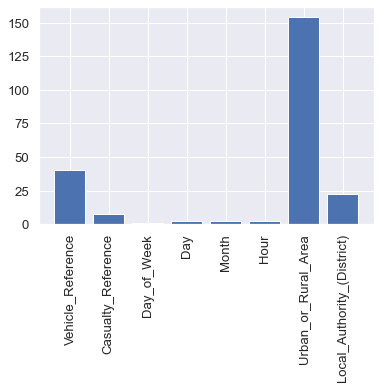

In [153]:
%matplotlib inline
#change y-axis to 100 is probability
# Perform the feature selection
selector = SelectKBest(f_classif, k="all")
selector.fit(usethisnow[predictors], usethisnow["Name of Accident Severity"])
# Here we will get the p-values for each feature and then transform from p-values into some scores
scores = -np.log10(selector.pvalues_)
# Use plt to plot the scores!  
plt.bar(range(len(predictors)), scores)
plt.xticks(range(len(predictors)), predictors, rotation='vertical')
plt.show()

# Supervised learning

Train test split 25 percent which means train 75 percent of data and test is 25 percent of data

In [154]:
y = usethisnow["Name of Accident Severity"].values
X = usethisnow.drop("Name of Accident Severity", axis=1)
X_train, X_test, y_train, y_test= train_test_split(X,y,test_size=.25,random_state=None)

# Machine learning with hyperparameter optimization

#### Using 4 classifiers to compare the model such as decision tree, KNN, Random Forest, and Naive Bayes. Moreover, using randomsearchcv to do hyperparameter tuning to improve the model

In [155]:
#DecisionTreeClassifier
dtree_params = {'criterion':['gini','entropy'],
              'splitter':['best','random'],
              'max_depth':[2,3,4,5,6,7,8],
              'max_features':['auto','sqrt','log2'],
             }
dtree=DecisionTreeClassifier()
dtree_random = RandomizedSearchCV(estimator = dtree, param_distributions = dtree_params,
                                  n_iter = 5, cv = 3, verbose=2, random_state=42, n_jobs = -1)
dtree_random.fit(X_train,y_train)
print(dtree_random.best_estimator_)


#KNeighborsClassifier
knn_params = {'n_neighbors' : range(1,10)
   }

knn=KNeighborsClassifier()
knn_random = RandomizedSearchCV(estimator = knn, param_distributions = knn_params, n_iter = 5,
                                cv = 3, verbose=2, random_state=42, n_jobs = -1)
knn_random.fit(X_train, y_train)
print(knn_random.best_estimator_)


#RandomForestClassifier
random_search = {'criterion': ['entropy', 'gini'],
               'n_estimators': [100,150,300]}

rfc = RandomForestClassifier()
rfc_random = RandomizedSearchCV(estimator = rfc, param_distributions = random_search, n_iter = 2, 
                               cv = 3, verbose= 1, random_state= 101, n_jobs = -1)
rfc_random.fit(X_train,y_train)
print(rfc_random.best_estimator_)


#NaiveBayes
param_grid_nb = {
    'var_smoothing': np.logspace(0,-9, num=100)
}

nbModel = GaussianNB()
nbModel_random = RandomizedSearchCV(estimator=nbModel, param_distributions=param_grid_nb,n_iter = 20, verbose=1, cv=3, n_jobs=-1)
nbModel_random.fit(X_train, y_train)
print(nbModel_random.best_estimator_)



Fitting 3 folds for each of 5 candidates, totalling 15 fits
DecisionTreeClassifier(max_depth=5, max_features='log2')
Fitting 3 folds for each of 5 candidates, totalling 15 fits
KNeighborsClassifier(n_neighbors=1)
Fitting 3 folds for each of 2 candidates, totalling 6 fits
RandomForestClassifier(n_estimators=300)
Fitting 3 folds for each of 20 candidates, totalling 60 fits
GaussianNB(var_smoothing=3.511191734215127e-05)


## DecisionTreeClassifier with Random Search

In [156]:
Train_accuracy = dtree_random.score(X_train, y_train)*100
Test_accuracy = dtree_random.score(X_test, y_test)*100
print(f"{colored('DecisionTreeClassifier with Random Search','blue')}")
print('Train_accuracy', Train_accuracy)
print('Test_accuracy', Test_accuracy)

DecisionTreeClassifier with Random Search
Train_accuracy 75.13898097618198
Test_accuracy 74.69400244798041


## KNeighborsClassifier with Random Search

In [157]:
Train_accuracy = knn_random.score(X_train, y_train)*100
Test_accuracy = knn_random.score(X_test, y_test)*100
print(f"{colored('KNeighborsClassifier with Random Search','blue')}")
print('Train_accuracy', Train_accuracy)
print('Test_accuracy', Test_accuracy)

KNeighborsClassifier with Random Search
Train_accuracy 99.63788442903045
Test_accuracy 82.42809057527539


## RandomForestClassifier with Random Search

In [158]:
Train_accuracy = rfc_random.score(X_train, y_train)*100
Test_accuracy = rfc_random.score(X_test, y_test)*100
print(f"{colored('RandomForestClassifier with Random Search','blue')}")
print('Train_accuracy', Train_accuracy)
print('Test_accuracy', Test_accuracy)

RandomForestClassifier with Random Search
Train_accuracy 99.68633651247004
Test_accuracy 86.3984088127295


## NaiveBayes with Random Search 

In [159]:
Train_accuracy = nbModel_random.score(X_train, y_train)*100
Test_accuracy = nbModel_random.score(X_test, y_test)*100
print(f"{colored('NaiveBayes with Random Search','blue')}")
print('Train_accuracy', Train_accuracy)
print('Test_accuracy', Test_accuracy)

NaiveBayes with Random Search
Train_accuracy 74.7564645279747
Test_accuracy 74.2579559363525


#### The best model is Random Forest with random search. Therefore, I decided to choose this classifier

## Probability of mymodel

#### Using predict_proba to find the probability of my data set to make it the same as Adjusted_Serious Adjusted_Slight	 of government model

In [160]:
y_pred=rfc_random.predict_proba(X_test)
y_pred

array([[0.12      , 0.88      ],
       [0.12333333, 0.87666667],
       [0.9       , 0.1       ],
       ...,
       [0.02666667, 0.97333333],
       [0.07666667, 0.92333333],
       [0.175     , 0.825     ]])

#### Adjusted_Slight probability of government model

In [161]:
Adjusted_Slight = df['Adjusted_Slight'].to_numpy()
Adjusted_Slight_train, Adjusted_Slight_test = train_test_split(Adjusted_Slight, test_size=0.25, shuffle=False)
Adjusted_Slight_test

array([1.        , 1.        , 1.        , ..., 0.91978718, 0.81666398,
       0.95147592])

#### Adjusted_Slight probability of my model

In [162]:
y_pred[:, 1]

array([0.88      , 0.87666667, 0.1       , ..., 0.97333333, 0.92333333,
       0.825     ])

#### Adjusted_Serious probability of government model 

In [163]:
Adjusted_Serious = df['Adjusted_Serious'].to_numpy()
Adjusted_Serious_train, Adjusted_Serious_test = train_test_split(Adjusted_Serious, test_size=0.25,shuffle=False)
Adjusted_Serious_test

array([0.        , 0.        , 0.        , ..., 0.08021282, 0.18333602,
       0.04852408])

#### Adjusted_Serious probability of my model

In [164]:
y_pred[:, 0]

array([0.12      , 0.12333333, 0.9       , ..., 0.02666667, 0.07666667,
       0.175     ])

# I) Compared my model to the government model

### The best model (Random Forest with Random search) calibration curve and mean predicted value 
The accident probability of more than 0.5 is Slight and a probability lower than 0.5 is Serious because y_pred[:,1] is adjusted Slight probability. 

Probability = 1 is Slight 100 percent. 

Probability = 0 is Slight 0 percent but it's Serious 100 percent.

Fitting 3 folds for each of 2 candidates, totalling 6 fits


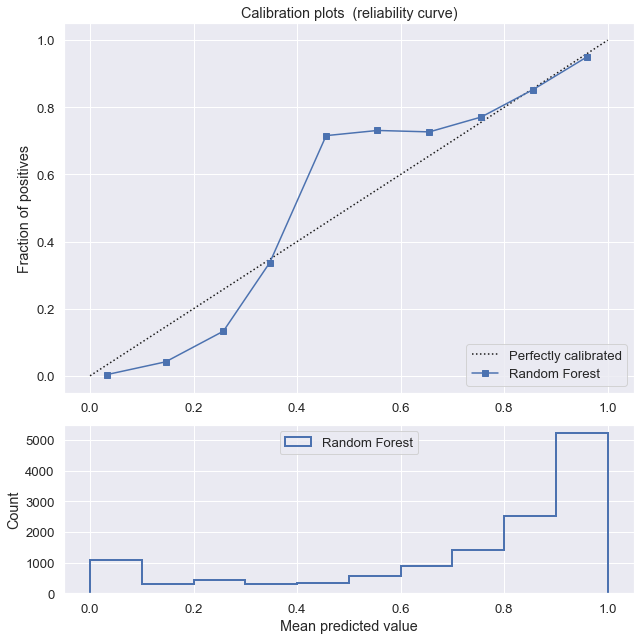

In [165]:
%matplotlib inline
plt.figure(figsize=(9, 9))
ax1 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
ax2 = plt.subplot2grid((3, 1), (2, 0))

ax1.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")
for clf, name in [(rfc_random, 'Random Forest')]:
    clf.fit(X_train, y_train)
    if hasattr(rfc_random, "predict_proba"):
        prob_pos = y_pred[:, 1]
    fraction_of_positives, mean_predicted_value = \
        calibration_curve(y_test, prob_pos, n_bins=10)

    ax1.plot(mean_predicted_value, fraction_of_positives, "s-",
             label="%s" % (name, ))

    ax2.hist(prob_pos, range=(0, 1), bins=10, label=name,
             histtype="step", lw=2)

ax1.set_ylabel("Fraction of positives")
ax1.set_ylim([-0.05, 1.05])
ax1.legend(loc="lower right")
ax1.set_title('Calibration plots  (reliability curve)')

ax2.set_xlabel("Mean predicted value")
ax2.set_ylabel("Count")
ax2.legend(loc="upper center", ncol=2)

plt.tight_layout()

### Government model calibration curve and mean predicted value

The accident probability more than 0.5 is Slight and probability lower than 0.5 is Serious.

The government model is similar to my model. However, changing y_pred[:,1] to Adjusted_Slight_test.

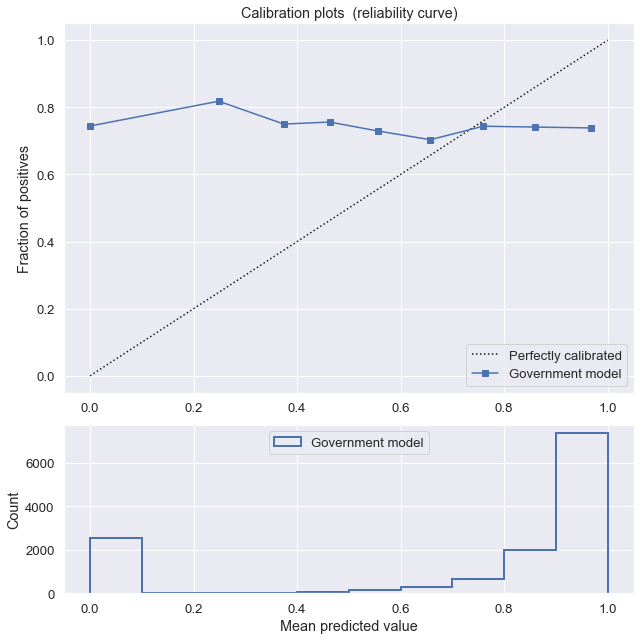

In [166]:
%matplotlib inline
plt.figure(figsize=(9, 9))
ax1 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
ax2 = plt.subplot2grid((3, 1), (2, 0))

ax1.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")
for name in [('Government model')]:
    if hasattr(clf, "predict_proba"):
        prob_pos = Adjusted_Slight_test
    fraction_of_positives, mean_predicted_value = \
        calibration_curve(y_test, prob_pos, n_bins=10)

    ax1.plot(mean_predicted_value, fraction_of_positives, "s-",
             label="%s" % (name, ))

    ax2.hist(prob_pos, range=(0, 1), bins=10, label=name,
             histtype="step", lw=2)

ax1.set_ylabel("Fraction of positives")
ax1.set_ylim([-0.05, 1.05])
ax1.legend(loc="lower right")
ax1.set_title('Calibration plots  (reliability curve)')

ax2.set_xlabel("Mean predicted value")
ax2.set_ylabel("Count")
ax2.legend(loc="upper center", ncol=2)

plt.tight_layout()